# Import the Library

In [193]:
import numpy as np
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset

In [4]:
path = r"C:\Users\suman\PROJECTS\Target_Phase2_Search_Term_Clustering\data v2.xlsx"
dataset = pd.read_excel(path)

In [5]:
dataset.head(25)

,search_terms,wk 1,wk 2,wk 3,wk 4,wk 5,wk 6,wk 7,wk 8,wk 9,...,wk 53,wk 54,wk 55,wk 56,wk 57,wk 58,wk 59,wk 60,wk 61,wk 62
0,$1 gift cards,72848.0,57156.0,1099.0,71916.0,31700.0,65996.0,58028.0,60564.0,52239.0,...,39966.0,41614.0,38862.0,14572.0,15601.0,8917.0,9358.0,24340.0,21677.0,19287.0
1,$2 gift cards,8067.0,9288.0,4099.0,8258.0,5709.0,10616.0,5009.0,6197.0,7866.0,...,13640.0,11163.0,14303.0,8431.0,8099.0,4668.0,2701.0,4380.0,6482.0,8623.0
2,$5 gift cards,2914.0,7470.0,NaN,1202.0,12490.0,12119.0,14724.0,6245.0,1093.0,...,5944.0,4720.0,4810.0,2805.0,2037.0,1754.0,2054.0,3074.0,4556.0,6626.0
3,$5 gift cards,138572.0,198611.0,96669.0,22963.0,104178.0,125459.0,132591.0,100540.0,161350.0,...,116880.0,107120.0,93911.0,100258.0,1952778.0,1033274.0,1310199.0,1478926.0,2129291.0,1893435.0
4,kindle,9244.0,11096.0,9232.0,8208.0,7600.0,6944.0,4563.0,9776.0,8700.0,...,4989.0,4932.0,5125.0,5017.0,33613.0,15980.0,20172.0,27206.0,33821.0,24743.0
5,0-3 month boy clothes,41294.0,66016.0,43532.0,38650.0,36968.0,39170.0,33404.0,30646.0,27269.0,...,35244.0,30758.0,31273.0,27630.0,152460.0,95613.0,103174.0,79931.0,73285.0,82744.0
6,00 flour,5082.0,5514.0,4694.0,2307.0,4756.0,2023.0,4190.0,4384.0,4472.0,...,1839.0,1831.0,1912.0,1668.0,14725.0,9074.0,13609.0,11795.0,10916.0,10720.0
7,0w-20 full synthetic oil,8715.0,16052.0,5634.0,4944.0,5310.0,6216.0,5664.0,7493.0,5473.0,...,13645.0,13031.0,12689.0,12653.0,47209.0,31921.0,36472.0,36895.0,36852.0,37507.0
8,1 1/2 inch binders 3 ring,38608.0,38373.0,30555.0,25724.0,21829.0,32557.0,23357.0,28714.0,36553.0,...,23670.0,23234.0,21263.0,20803.0,91654.0,65868.0,93186.0,71744.0,66519.0,77834.0
9,1 1/2 inch curling iron,6643.0,11388.0,10998.0,10074.0,6626.0,4615.0,8430.0,9124.0,6342.0,...,8247.0,6525.0,8301.0,7172.0,56565.0,39709.0,47004.0,38452.0,33137.0,35352.0


In [24]:
updated_dataset = dataset.iloc[:,1:]

# Analysis of Dataset

In [27]:
def report_nulls(dataset):
    null_counts = dataset.isnull().sum()
    print("No of nulls for each column is \n",null_counts)
    total_count = null_counts.sum()
    print("Total count of nulls is \n",total_count)

In [28]:
report_nulls(updated_dataset)

No of nulls for each column is 
 wk 1     209
wk 2      87
wk 3     159
wk 4     148
wk 5     201
        ... 
wk 58     23
wk 59     16
wk 60     12
wk 61    372
wk 62    190
Length: 62, dtype: int64
Total count of nulls is 
 21419


# KNN Imputation and hyper parameter tuning using GridSearchCV

In [42]:
#KNN Imputation for dataset 
imputer = KNNImputer()
parameters = {
    'n_neighbors': [1, 3, 5, 7, 9],
}
scoring = {
    'MSE': 'neg_mean_squared_error',
    'RMSE': 'neg_root_mean_squared_error',
    'MAE': 'neg_mean_absolute_error',
    'R2': 'r2',
    'Explained Variance': 'explained_variance',
    'Median Absolute Error': 'neg_median_absolute_error',
}
grid_search = GridSearchCV(imputer, parameters, scoring=scoring, refit='MSE', cv=5)
grid_search.fit(updated_dataset)
# updated_dataset = imputer.fit_transform(updated_dataset)

C:\Users\suman\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:842: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\suman\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 136, in __call__
    score = scorer._score(
            ^^^^^^^^^^^^^^
TypeError: _PredictScorer._score() missing 1 required positional argument: 'y_true'

  warnings.warn(
C:\Users\suman\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:842: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\suman\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_scorer.py", line 136, in __call__
    score = scorer._score(
           

GridSearchCV(cv=5, estimator=KNNImputer(),
             param_grid={'n_neighbors': [1, 3, 5, 7, 9]}, refit='MSE',
             scoring={'Explained Variance': 'explained_variance',
                      'MAE': 'neg_mean_absolute_error',
                      'MSE': 'neg_mean_squared_error',
                      'Median Absolute Error': 'neg_median_absolute_error',
                      'R2': 'r2', 'RMSE': 'neg_root_mean_squared_error'})

In [43]:
results = grid_search.cv_results_

In [44]:
results

{'mean_fit_time': array([0.0074183 , 0.00492439, 0.00314231, 0.00312395, 0.00695057]),
 'std_fit_time': array([0.00408798, 0.00402276, 0.00628462, 0.0062479 , 0.00858399]),
 'mean_score_time': array([0.00049391, 0.        , 0.        , 0.00312667, 0.        ]),
 'std_score_time': array([0.00098782, 0.        , 0.        , 0.00625334, 0.        ]),
 'param_n_neighbors': masked_array(data=[1, 3, 5, 7, 9],
              mask=[False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'n_neighbors': 1},
  {'n_neighbors': 3},
  {'n_neighbors': 5},
  {'n_neighbors': 7},
  {'n_neighbors': 9}],
 'split0_test_MSE': array([nan, nan, nan, nan, nan]),
 'split1_test_MSE': array([nan, nan, nan, nan, nan]),
 'split2_test_MSE': array([nan, nan, nan, nan, nan]),
 'split3_test_MSE': array([nan, nan, nan, nan, nan]),
 'split4_test_MSE': array([nan, nan, nan, nan, nan]),
 'mean_test_MSE': array([nan, nan, nan, nan, nan]),
 'std_test_MSE': array([nan, nan, nan, nan

In [58]:
best_hyperparams = grid_search.best_params_
best_model = grid_search.best_estimator_
best_score = grid_search.best_score_
cv_results = grid_search.cv_results_
print("Best Hyperparameters,model,score:", best_hyperparams,best_model,best_score)

Best Hyperparameters,model,score: {'n_neighbors': 1} KNNImputer(n_neighbors=1) nan


In [56]:
updated_dataset = pd.DataFrame(updated_dataset)

In [46]:
report_nulls(updated_dataset)

No of nulls for each column is 
 0     0
1     0
2     0
3     0
4     0
     ..
57    0
58    0
59    0
60    0
61    0
Length: 62, dtype: int64
Total count of nulls is 
 0


In [49]:
Search_Terms,Frequency_values = dataset.iloc[:,0],updated_dataset

In [50]:
Search_Terms

0                    $1 gift cards
1                    $2 gift cards
2                    $5 gift cards
3                    $5 gift cards
4                           kindle
                   ...            
15785       retirement decorations
15786    retirement gift for women
15787     retirement gifts for men
15788        retractable baby gate
15789       retractable badge clip
Name: search_terms, Length: 15790, dtype: object

In [103]:
Frequency_values['Mean_values'] = [0]*Frequency_values.shape[0]

In [104]:
Frequency_values.shape

(15790, 63)

In [105]:
#adding mode value for each search term
for row in range(Frequency_values.shape[0]):
    count = 0
    for col in Frequency_values.iloc[row,:]:
        count += col
    print(count,Frequency_values['Mean_values'][row])    
    Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)   

1593164.0 0
577456.5 0
299235.0 0
20582336.0 0
623222.0 0
2460599.0 0
258913.5 0
665762.5 0
3393735.5 0
690963.0 0
193735.5 0
1111683.5 0
332949.5 0
2740719.0 0
261806.0 0
276496.0 0
2019701.0 0
3013216.0 0
335043.0 0
229214.0 0
1453276.0 0
1341007.5 0
4007161.0 0
1149735.0 0
758458.0 0
2883460.0 0
1316050.0 0
7853890.0 0
1020298.0 0
1414385.0 0
289369.5 0
6350024.0 0
146452.5 0
206273.5 0
2047914.0 0
15417790.0 0
5361543.0 0
527758.0 0
1114904.0 0
883430.0 0
496546.0 0
957341.0 0
763701.5 0
333396.0 0
1714117.0 0
670839.0 0
303738.0 0
459996.5 0
464437.0 0
239886.5 0
354005.0 0
2150174.0 0
6163850.0 0
4091688.0 0
194575.5 0
397331.0 0
393242.0 0
497601.0 0
5193881.0 0
287896.5 0
20911121.0 0
261639.5 0
3640791.0 0
7147612.5 0
16871051.0 0
276573.0 0
750721.0 0
489691.0 0
491741.0 0
175950.0 0
231269.0 0
772688.5 0
842856.0 0
181229.0 0
197232.0 0
1873116.0 0
581478.0 0
153636.0 0
224939.5 0
10483218.0 0
9377848.0 0
197998.5 0
1221019.0 0
380014.0 0
408114.5 0
395947.0 0
315607.0 0
204

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

406585.0 0
263815.0 0
678815.5 0
1636004.0 0
652258.5 0
184247.0 0
571225.5 0
265991.5 0
370367.0 0
159392.0 0
266104.0 0
348483.0 0
3331755.0 0
1545356.5 0
588819.0 0
810630.0 0
224926.5 0
391230.0 0
335313.5 0
191521.0 0
3326902.0 0
1871247.0 0
268100.0 0
214722.5 0
229070.5 0
961613.0 0
507711.0 0
189011.0 0
174575.0 0
216654.0 0
286632.0 0
1365097.0 0
1047466.0 0
938115.0 0
515370.5 0
1634932.5 0
287725.0 0
621789.0 0
1068708.5 0
182870.0 0
229080.0 0
192086.0 0
738742.0 0
380203.0 0
400016.0 0
1086036.5 0
214721.0 0
242347.0 0
241459.0 0
208529.0 0
335179.5 0
172668.0 0
181629.5 0
41038409.5 0
6189635.0 0
3985735.0 0
349381.0 0
146224.0 0
467354.0 0
222599.5 0
8387173.0 0
370594.5 0
1273018.0 0
25793773.0 0
3235426.0 0
2902330.0 0
1870745.5 0
370787.0 0
331777.0 0
11373973.0 0
785018.0 0
192062.5 0
275251.0 0
789433.0 0
784886.5 0
313307.0 0
422708.5 0
2573539.0 0
229860.5 0
686467.0 0
1200750.0 0
258848.5 0
1188767.0 0
337477.5 0
474648.0 0
21406832.0 0
187527.5 0
449103.0 0
1676

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

345293.5 0
3466444.0 0
2611353.0 0
550065.5 0
196734.5 0
546962.5 0
354950.0 0
576778.0 0
451702.0 0
910142.5 0
146209.0 0
431734.0 0
2352397.0 0
14287318.0 0
3906653.0 0
2360276.0 0
224855.5 0
17342769.0 0
19771209.0 0
961607.5 0
197094.5 0
436509.5 0
374665.0 0
975889.0 0
247749.5 0
2010910.5 0
174096.5 0
2915847.0 0
394745.0 0
694545.5 0
20712278.0 0
3926316.0 0
182966.0 0
1494030.5 0
455412.5 0
205364.5 0
1006239.0 0
365160.0 0
263101.0 0
397771.5 0
718309.0 0
596520.5 0
533455.0 0
1007690.0 0
1268166.0 0
270391.0 0
583731.0 0
152589306.0 0
8318063.0 0
773957.0 0
749200.5 0
153766.0 0
284595.5 0
341088.5 0
315337.5 0
2593277.0 0
1814535.0 0
189577.5 0
1835725.0 0
197561.5 0
1101360.5 0
275293.5 0
4904401.5 0
808255.0 0
1494106.0 0
808197.0 0
487085.0 0
566858.0 0
463693.0 0
210199.0 0
172161.5 0
333770.0 0
398574.0 0
474534.5 0
196056.5 0
1292962.0 0
752339.5 0
8540461.0 0
737405.0 0
831851.0 0
509403.0 0
234774.5 0
233988.0 0
623181.0 0
279062.5 0
415931.0 0
543344.0 0
695098.5 0


C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

236354.0 0
665260.0 0
386000.0 0
154581.5 0
225669.5 0
463138.5 0
220938.0 0
267609.5 0
152781.5 0
204366.5 0
244772.0 0
912809.0 0
386912.5 0
5656744.0 0
332996.0 0
975415.0 0
467237.0 0
244343.5 0
897225.5 0
166846.5 0
218690.5 0
451226.0 0
2797702.5 0
3073860.0 0
314628.5 0
550428.5 0
1317408.0 0
3307539.0 0
625872.5 0
485984.0 0
813720.5 0
1909394.0 0
316022.0 0
279708.0 0
1230128.5 0
442514.5 0
1880333.0 0
362740.0 0
447312.0 0
255348.5 0
243002.0 0
353541.0 0
641943.0 0
1203929.5 0
175419.0 0
213405.5 0
255656.0 0
1310855.0 0
356954.0 0
184223.0 0
477233.0 0
586591.0 0
165637.0 0
835277.0 0
631210.0 0
590340.5 0
404647.0 0
1639241.5 0
2625240.0 0
456753.5 0
877090.5 0
224842.0 0
1252579.0 0
1828576.0 0
177920.0 0
205123.5 0
390366.0 0
1204982.5 0
347560.5 0
1052426.0 0
835105.0 0
342000.0 0
1570745.0 0
151154.0 0
256802.5 0
379897.5 0
608132.5 0
618657.0 0
543369.5 0
230578.5 0
669647.0 0
514382.0 0
992678.0 0
374645.5 0
220914.5 0
937152.0 0
314241.0 0
789685.0 0
264483.0 0
2288

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

477786.5 0
4014938.0 0
535372.5 0
170702.5 0
805635.0 0
5397738.0 0
381834.5 0
1606044.0 0
10672547.0 0
1120508.5 0
5045401.0 0
317211.0 0
1363293.0 0
262305.0 0
183723.5 0
173556.0 0
814441.0 0
510189.0 0
2876401.0 0
494087.0 0
1339956.5 0
3280474.0 0
193585.0 0
532571.0 0
1008442.0 0
3275021.0 0
863540.0 0
220477.0 0
473461.0 0
8013966.0 0
873229.0 0
713840.0 0
10285744.0 0
425083.5 0
295800.5 0
244737.0 0
884021.5 0
23878175.0 0
10828233.0 0
372164.0 0
224359.0 0
1015880.0 0
2046394.5 0
1598999.0 0
711748.0 0
575356.0 0
155833.0 0
740722.0 0
1567773.0 0
834744.0 0
645860.0 0
251846.5 0
226022.0 0
288184.0 0
963351.5 0
651210.5 0
503074.0 0
389304.0 0
728795.0 0
241922.0 0
360946.0 0
273946.0 0
285733.5 0
712886.0 0
167797.0 0
203964.0 0
165792.0 0
403248.0 0
458435.0 0
272879.0 0
1652539.0 0
182820.5 0
207021.5 0
3725302.0 0
371874.0 0
207383.0 0
534104.5 0
444273.5 0
363617.0 0
527025.0 0
1053157.0 0
3276112.5 0
405149.5 0
3185431.5 0
158341.5 0
269253.0 0
415916.5 0
509706.0 0
180

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

451418.0 0
483078.5 0
3634112.0 0
570728.0 0
233575.0 0
3314344.0 0
275672.5 0
253314.5 0
581340.5 0
300681.0 0
517666.0 0
612686.0 0
293978.0 0
656927.0 0
667621.0 0
313467.5 0
200614.5 0
260673.0 0
306533.5 0
221276.0 0
1497806.5 0
284629.0 0
217373.5 0
188883.5 0
213904.0 0
512807.5 0
1314779.0 0
607472.0 0
740109.5 0
220310.0 0
1597755.0 0
396261.0 0
291107.0 0
467580.0 0
234043.0 0
976771.0 0
164814.5 0
452977.0 0
231426.5 0
263290.0 0
630690.5 0
254865.5 0
181988.0 0
239775.0 0
162820.0 0
309366.5 0
275626.5 0
474435.5 0
228204.0 0
1142818.5 0
223001.0 0
237904.0 0
201752.0 0
3833455.0 0
348241.0 0
679860.0 0
349691.0 0
191390.5 0
2005683.5 0
8439362.0 0
688991.0 0
963577.5 0
1111694.0 0
307212.5 0
154626.5 0
1918387.0 0
1726354.0 0
1044148.0 0
1097384.0 0
207072.0 0
1077336.0 0
2887483.0 0
673797.0 0
344929.0 0
265331.5 0
384716.5 0
502367.0 0
346559.5 0
589860.0 0
845189.5 0
908469.0 0
1054403.0 0
2616858.5 0
7766891.0 0
3524149.0 0
680628.0 0
2079824.0 0
196892.5 0
210148.0 0


C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

4415450.0 0
223136.0 0
841899.0 0
1887979.0 0
197818.5 0
480791.0 0
441628.0 0
152680.0 0
322888.0 0
919427.0 0
244246.0 0
504679.0 0
302702.0 0
615418.5 0
209321.0 0
417316.0 0
154207.0 0
4134220.5 0
1014175.5 0
472727.0 0
4607469.0 0
683873.0 0
610311.5 0
220983.5 0
359120.5 0
130430.0 0
228777.5 0
400234.0 0
1156480.0 0
15172949.0 0
616430.0 0
913099.0 0
697148.0 0
633021.0 0
599573.0 0
513732.5 0
393024.0 0
2880118.0 0
1191781.0 0
451025.0 0
232858.5 0
1392865.0 0
2820327.0 0
245948.0 0
2547735.0 0
6453945.0 0
3630984.0 0
1392211.0 0
246318.5 0
976673.0 0
140230.5 0
584341.5 0
176743.0 0
2455691.0 0
397980.5 0
705721.0 0
301568.0 0
372209.0 0
1383709.0 0
4476086.0 0
958200.5 0
1474187.5 0
559494.0 0
694276.5 0
2429093.0 0
259640.0 0
186976.0 0
1453342.0 0
429808.0 0
197454.5 0
173487.0 0
2920303.0 0
298801.0 0
327694.0 0
656164.0 0
577256.0 0
225060.5 0
298468.0 0
2154912.0 0
515002.5 0
341500.0 0
199547.0 0
1247810.0 0
254889.5 0
895051.0 0
387214.0 0
293848.0 0
361148.0 0
641049.

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

198839.5 0
317964.5 0
202964.0 0
557005.5 0
378269.0 0
496469.0 0
620401.5 0
372644.0 0
1370591.0 0
232800.0 0
624654.0 0
270104.0 0
238068.5 0
210964.5 0
327947.0 0
279524.5 0
459652.5 0
212319.5 0
847273.0 0
2669749.0 0
558041.0 0
588211.0 0
253268.5 0
2840749.0 0
183677.5 0
257473.0 0
136962.0 0
4280741.0 0
193815.5 0
2760925.5 0
580810.0 0
156869.0 0
592240.0 0
338245.0 0
218077.0 0
1218262.0 0
1405407.0 0
1187092.0 0
174271.5 0
450676.0 0
403229.0 0
1197012.0 0
198106.5 0
322026.0 0
641994.0 0
228492.0 0
378260.0 0
274203.0 0
186515.5 0
3920495.0 0
178987.5 0
342264.0 0
4067011.5 0
690183.0 0
259341.0 0
186538.0 0
212319.0 0
171782.5 0
2900337.0 0
512554.0 0
936690.5 0
1042650.0 0
1217060.0 0
839403.0 0
719647.5 0
203684.0 0
3284263.0 0
473761.5 0
3554048.0 0
299011.5 0
417950.5 0
403128.5 0
160170.5 0
1248699.0 0
497664.0 0
304510.0 0
132728.0 0
569479.0 0
2564555.0 0
593707.0 0
228769.0 0
218905.5 0
2018900.0 0
228675.0 0
157260.0 0
195711.5 0
1685641.0 0
1090588.0 0
164094.5 0


C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

195032.0 0
253365.0 0
946104.0 0
208206.0 0
267362.0 0
198222.0 0
35298315.0 0
2787186.0 0
146253.0 0
1190815.0 0
569162.0 0
230656.5 0
798270.0 0
400165.0 0
342491.5 0
277341.0 0
730526.0 0
19699883.0 0
368806.0 0
609610.0 0
614875.0 0
181072.0 0
1377897.0 0
315886.5 0
586185.5 0
935194.0 0
867240.0 0
194155.0 0
691761.0 0
326905.0 0
199017.5 0
815624.0 0
274062.0 0
386678.0 0
322329.0 0
270124.0 0
215999.0 0
891545.0 0
451473.5 0
3980996.0 0
738782.0 0
850793.5 0
282680.0 0
202004.5 0
545795.0 0
430443.0 0
3060687.0 0
776088.0 0
255050.0 0
284162.5 0
223099.0 0
428778.5 0
4303055.0 0
3095851.0 0
451231.0 0
178444.5 0
242420.5 0
203584.5 0
1323638.0 0
471384.0 0
325027.0 0
364864.0 0
474564.0 0
275755.5 0
707210.0 0
653869.0 0
382715.0 0
209372.5 0
495227.0 0
705992.5 0
372011.0 0
32373038.0 0
976915.0 0
898883.0 0
3832492.0 0
386004.0 0
191724.5 0
936709.5 0
398326.0 0
976175.0 0
1253262.0 0
327270.5 0
797510.0 0
452386.0 0
615360.0 0
4656567.0 0
792703.0 0
1657649.0 0
1710098.0 0
46

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

3756760.0 0
10307680.0 0
258563.0 0
4374509.0 0
928450.0 0
1856225.0 0
5105386.5 0
238002.5 0
523935.0 0
4433629.0 0
358954.0 0
169696.0 0
291541.5 0
1034211.0 0
555976.0 0
351579.5 0
1456004.5 0
1813837.0 0
606761.0 0
2359210.0 0
1117558.0 0
699016.5 0
446004.0 0
1229780.0 0
173584.0 0
3616272.5 0
291895.5 0
1251579.0 0
707652.0 0
3339002.0 0
265734.0 0
9824624.0 0
211422.5 0
332265.5 0
3611854.0 0
621959.0 0
3179108.0 0
3047000.0 0
1856439.0 0
315822.0 0
1458573.0 0
1723858.0 0
186865.0 0
375290.0 0
219248.5 0
6480833.0 0
239710.0 0
555842.0 0
222590.5 0
604932.0 0
490053.0 0
834794.0 0
386133.0 0
2318402.0 0
166823.0 0
2982372.0 0
222539.0 0
550814.0 0
176241.5 0
146826.0 0
235006.0 0
1429306.0 0
3998336.0 0
263802.0 0
213079.5 0
1096303.5 0
364668.0 0
901891.0 0
163887.0 0
2390497.0 0
1042006.0 0
382771.0 0
1656518.0 0
331912.5 0
334513.5 0
169007.0 0
5365989.0 0
323337.0 0
196436.0 0
2948336.0 0
442367.5 0
335536.0 0
157891.5 0
156375.0 0
206805.5 0
481871.5 0
254922.0 0
414588.0 

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

251896.0 0
757964.0 0
408787.0 0
2165696.0 0
5276010.5 0
245249.5 0
2507885.0 0
278566.5 0
428406.0 0
174030.0 0
175231.5 0
210233.5 0
382214.5 0
425386.0 0
512328.0 0
693521.0 0
1783440.0 0
1157086.0 0
189558.0 0
856953.0 0
231776.0 0
194817.5 0
356454.5 0
3525307.0 0
855880.0 0
205045.5 0
606041.5 0
249702.0 0
769387.0 0
1195957.0 0
183245.0 0
249111.0 0
641052.0 0
634087.0 0
5719640.0 0
465317.0 0
837513.0 0
317517.5 0
322159.0 0
1049298.0 0
4905830.5 0
208031.0 0
384455.0 0
166815.0 0
397324.0 0
166717.0 0
257617.5 0
227506.0 0
158634.5 0
355692.5 0
1025735.0 0
3561752.0 0
639160.0 0
448576.5 0
169781.0 0
2461565.0 0
951038.5 0
1198115.0 0
332297.0 0
364442.0 0
2725698.0 0
814010.0 0
297854.5 0
323394.0 0
1578644.0 0
469822.0 0
550242.5 0
326129.0 0
3614986.0 0
180750.5 0
1983559.0 0
220929.0 0
541725.0 0
28417615.0 0
774476.5 0
215244.0 0
685753.0 0
453073.5 0
790245.0 0
205837.0 0
397575.0 0
690270.0 0
2413912.0 0
2024098.0 0
1323303.0 0
3809344.0 0
272072.5 0
266211.0 0
703520.0

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

145907.0 0
2307888.0 0
283726.5 0
360089.0 0
270546.0 0
162479.0 0
230259.0 0
608744.0 0
227443.0 0
308645.0 0
2382397.0 0
416800.5 0
213356.5 0
275543.5 0
291251.0 0
854460.0 0
185332.0 0
1681386.0 0
260366.5 0
229388.0 0
792936.0 0
587546.5 0
449279.5 0
601687.0 0
301385.0 0
306588.0 0
1104647.0 0
930233.0 0
229514.0 0
3304947.0 0
170525.5 0
798053.0 0
229190.0 0
348263.0 0
1351095.0 0
882716.0 0
576960.5 0
226076.5 0
172500.0 0
775559.0 0
3442895.0 0
209166.5 0
394305.0 0
198664.5 0
1055046.0 0
794609.0 0
810454.0 0
740467.0 0
222641.5 0
624121.0 0
1820126.0 0
904436.5 0
273345.0 0
411047.0 0
935418.0 0
193521.0 0
2037662.0 0
220599.5 0
279422.0 0
190513.0 0
157565.5 0
9264287.0 0
647216.0 0
149578.0 0
8026064.0 0
185647.5 0
384862.5 0
953103.0 0
313382.0 0
186296.0 0
399973.0 0
437478.0 0
159744.5 0
306833.0 0
1202992.0 0
397055.0 0
751951.0 0
734490.5 0
671104.0 0
474017.5 0
3922958.0 0
184237.5 0
461321.5 0
392089.0 0
281059.0 0
2300352.0 0
214784.5 0
195558.0 0
179708.5 0
580485

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

6342855.5 0
771771.0 0
900512.0 0
199216.0 0
221543.0 0
246399.0 0
715451.0 0
192436.0 0
332021.0 0
266988.5 0
292140.5 0
389427.0 0
255271.0 0
341072.0 0
634001.0 0
2449333.0 0
2307046.0 0
382995.0 0
3268634.0 0
3468412.0 0
307508.0 0
682507.0 0
321273.5 0
3387074.0 0
2226703.0 0
257874.5 0
224306.5 0
163000.5 0
912627.0 0
206733.0 0
333587.0 0
202038.5 0
997282.0 0
302526.5 0
1221820.0 0
311281.5 0
205650.0 0
246286.0 0
963338.0 0
510642.0 0
208061.0 0
236242.0 0
177912.5 0
1586440.0 0
233891.0 0
247661.5 0
335378.0 0
493810.0 0
1308970.0 0
303956.0 0
306496.0 0
172255.5 0
307441.0 0
185156.5 0
868594.0 0
172923.0 0
253697.0 0
2127072.0 0
500771.0 0
523057.0 0
650763.0 0
216161.0 0
277155.0 0
367213.0 0
443615.0 0
460185.5 0
373494.0 0
3283210.0 0
452316.5 0
986429.0 0
2100539.5 0
1430066.5 0
138204.0 0
332323.5 0
595232.5 0
194234.5 0
6514923.0 0
226846.5 0
243825.0 0
509465.0 0
1423361.5 0
235559.0 0
168249.0 0
615672.5 0
222609.5 0
643008.0 0
381032.0 0
155231.5 0
2483207.0 0
1659

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

3307712.0 0
445439.0 0
362240.0 0
243752.5 0
7687865.0 0
489619.5 0
369662.0 0
269090.0 0
863364.0 0
211350.0 0
2889958.0 0
376173.0 0
365559.0 0
2390938.0 0
210402.0 0
193665.0 0
265382.5 0
603380.5 0
344211.5 0
313727.0 0
150761.0 0
209949.0 0
1584980.0 0
445999.0 0
362317.0 0
1367588.0 0
1150583.0 0
647012.5 0
295908.0 0
3129468.0 0
217339.0 0
2238797.0 0
425890.5 0
2572705.0 0
211407.0 0
3231211.5 0
393833.5 0
236702.0 0
1763937.0 0
1897864.0 0
357559.5 0
576717.5 0
659797.0 0
428408.0 0
226146.5 0
452062.5 0
184452.0 0
357950.0 0
287112.0 0
381963.0 0
231146.0 0
1628573.0 0
1415293.0 0
282979.5 0
336103.5 0
298977.0 0
265578.5 0
270235.0 0
454865.0 0
221188.0 0
897547.0 0
1045954.0 0
285211.0 0
339237.5 0
373216.5 0
3313620.0 0
394962.0 0
162311.0 0
226852.0 0
286201.5 0
581748.5 0
1192894.5 0
1717661.5 0
206119.0 0
9469569.0 0
264026.5 0
564191.0 0
461095.0 0
346114.5 0
11915230.0 0
1520632.5 0
221731.5 0
762210.5 0
221848.0 0
2300633.0 0
660522.0 0
11003911.0 0
1206047.0 0
34178

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

715486.0 0
1779178.0 0
266678.0 0
1441269.0 0
1071136.0 0
7778187.0 0
490207.5 0
421554.0 0
206447.0 0
249146.5 0
269978.0 0
326305.0 0
425075.0 0
4351766.5 0
825178.0 0
5535505.0 0
250079.0 0
1222254.0 0
419135.0 0
538103.0 0
182440.0 0
3415460.0 0
12676554.0 0
163063.0 0
1465568.0 0
516337.5 0
201778.5 0
162799.0 0
620776.0 0
1054714.0 0
514823.0 0
242722.0 0
567481.0 0
324850.0 0
1036535.0 0
454803.5 0
229589.0 0
474456.0 0
784614.0 0
1916807.0 0
263225.5 0
224556.5 0
1136444.0 0
381857.5 0
14623862.0 0
2999227.0 0
169980.0 0
519894.0 0
517972.0 0
187554.5 0
352130.0 0
668649.0 0
446833.5 0
289756.0 0
175200.0 0
762321.5 0
3873097.0 0
582736.0 0
7193898.0 0
1360747.5 0
437139.0 0
416101.0 0
193405.0 0
227042.0 0
4621526.0 0
912471.5 0
782335.0 0
1376727.0 0
747063.0 0
235704.0 0
785809.0 0
984996.0 0
224499.5 0
11365713.0 0
299525.5 0
12556711.0 0
11877219.0 0
246705.0 0
16398678.0 0
148584.5 0
964006.0 0
541411.0 0
261578.5 0
559643.5 0
755708.5 0
16379232.0 0
1899374.0 0
9124288.0

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

1083294.0 0
804576.0 0
439000.0 0
2335515.0 0
269822.0 0
888735.0 0
1458920.0 0
731497.0 0
1057384.0 0
663811.5 0
173747.0 0
1042333.5 0
603430.5 0
494280.5 0
1019674.0 0
233099.5 0
674347.0 0
926628.0 0
279850.0 0
536653.0 0
1994706.0 0
368279.0 0
242317.0 0
824116.0 0
225709.5 0
309626.0 0
310303.5 0
545238.5 0
213979.0 0
794291.0 0
248537.0 0
190533.0 0
275034.5 0
483574.5 0
846304.0 0
435629.0 0
2309233.0 0
1080338.0 0
674462.0 0
6448395.0 0
207203.0 0
309721.0 0
201006.5 0
854290.0 0
295359.0 0
222255.5 0
751382.0 0
3172394.0 0
2387923.0 0
1359706.0 0
440086.0 0
292650.5 0
302119.5 0
395912.0 0
1375841.0 0
179551.0 0
2344651.0 0
595242.0 0
158100.0 0
382886.0 0
754747.5 0
436864.0 0
1267381.0 0
1943856.0 0
595452.5 0
230097.5 0
783212.0 0
1413289.0 0
1186819.0 0
232189.5 0
259515.0 0
9077203.0 0
346087.0 0
430944.0 0
184314.0 0
391131.0 0
6056299.0 0
425553.5 0
413724.0 0
1113990.0 0
271560.5 0
328751.0 0
536674.5 0
199977.0 0
380101.0 0
517508.0 0
269707.0 0
167190.0 0
10248502.0

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

262963.0 0
1088784.0 0
181816.0 0
1090773.0 0
247913.0 0
700512.5 0
581597.0 0
627598.0 0
6898371.0 0
229172.0 0
772920.0 0
2435525.0 0
5215777.5 0
1618024.0 0
416546.0 0
591040.0 0
190671.5 0
290736.0 0
406302.5 0
957546.0 0
215066.5 0
257128.5 0
6229778.0 0
338029.5 0
1792937.0 0
29469584.0 0
632132.0 0
924811.0 0
232967.5 0
299498.0 0
519388.5 0
762880.5 0
2406892.0 0
212458.0 0
975474.0 0
336518.5 0
400899.0 0
529841.5 0
1837556.0 0
1622292.0 0
262549.5 0
327120.0 0
534284.5 0
3009525.0 0
921126.0 0
209992.5 0
498286.0 0
354785.0 0
442436.5 0
1080218.0 0
663109.0 0
220039.5 0
522671.0 0
267386.0 0
6799114.0 0
277593.0 0
1031386.5 0
977746.0 0
7125792.0 0
397761.0 0
280679.0 0
623635.5 0
734035.0 0
652805.0 0
361666.0 0
2581235.0 0
2240153.5 0
4812440.0 0
717842.0 0
1011717.5 0
259547.0 0
273743.0 0
387609.0 0
309071.0 0
1305175.0 0
700738.0 0
200257.0 0
223706.0 0
201861.5 0
167458.5 0
981929.5 0
632580.0 0
735450.0 0
270489.0 0
212404.0 0
780199.5 0
212958.0 0
9530070.0 0
965474.0

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

180849.5 0
512636.0 0
1663055.0 0
505180.5 0
290728.0 0
366091.0 0
800911.5 0
997795.5 0
203894.0 0
259411.0 0
271652.0 0
425898.5 0
1236784.5 0
561399.0 0
738318.5 0
1227590.0 0
197882.0 0
250414.0 0
1383238.0 0
275910.0 0
164018.0 0
296738.0 0
758547.0 0
3086051.0 0
227943.5 0
1584341.0 0
884242.5 0
249550.0 0
348732.0 0
351135.5 0
630235.0 0
2840437.0 0
3236741.0 0
527240.0 0
1685156.0 0
757508.0 0
271749.0 0
351949.0 0
1327902.0 0
288063.0 0
195028.0 0
496063.5 0
486048.0 0
261012.0 0
374717.5 0
419852.0 0
343993.0 0
147279.0 0
258416.0 0
426750.0 0
1111878.0 0
348846.0 0
196004.5 0
1082811.5 0
397498.5 0
243948.5 0
1747553.5 0
8253492.0 0
2267415.0 0
1478602.0 0
166200.5 0
219147.5 0
699749.0 0
149737.5 0
219453.0 0
349988.0 0
221274.0 0
3433202.5 0
204886.5 0
238822.0 0
1169448.0 0
472810.0 0
186754.5 0
265351.5 0
3053561.0 0
2133729.0 0
154287.5 0
957884.0 0
501315.0 0
863833.0 0
161412.0 0
209548.0 0
633037.0 0
291847.0 0
172418.0 0
169097.5 0
715853.0 0
852905.0 0
2264408.0 0


C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

657378.5 0
513484.0 0
320186.0 0
406700.5 0
727862.5 0
258781.0 0
188226.0 0
327955.0 0
273671.0 0
163346.5 0
560270.0 0
375529.0 0
7293414.0 0
1275597.5 0
378896.0 0
372090.5 0
313425.0 0
490691.5 0
1031705.0 0
308944.5 0
366969.0 0
722373.5 0
167076.5 0
258296.5 0
293275.0 0
278280.5 0
706695.0 0
288963.0 0
163322.5 0
481584.0 0
4951939.0 0
1463153.0 0
389713.5 0
281604.0 0
67939926.0 0
540124.0 0
235052.0 0
257371.0 0
456103.0 0
387655.0 0
940673.0 0
315313.0 0
722995.0 0
816377.0 0
380731.0 0
756904.0 0
5785513.0 0
725760.5 0
1156211.0 0
144942.0 0
163334.0 0
453042.0 0
244791.0 0
158700.5 0
850916.0 0
1231220.0 0
2093299.0 0
541671.0 0
772085.5 0
189195.0 0
560566.0 0
228556.0 0
405931.0 0
315783.5 0
7028988.0 0
1320105.0 0
2118448.5 0
1249225.5 0
349770.0 0
1047516.5 0
211523.5 0
437311.0 0
512483.0 0
813635.0 0
239833.5 0
156148.5 0
249278.0 0
812584.0 0
597306.5 0
1066061.0 0
276934365.0 0
241059.5 0
254952.0 0
3727105.0 0
3495805.0 0
876476.0 0
415956.0 0
1041036.0 0
155848.5 

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

170954.5 0
1140090.0 0
596488.5 0
1380843.0 0
261618.0 0
268079.0 0
247455.0 0
295397.0 0
157871.0 0
458830.0 0
2539849.5 0
1532365.5 0
522349.0 0
335540.0 0
404708.5 0
911119.0 0
3313652.0 0
557398.0 0
833890.0 0
364205.0 0
6570184.0 0
270103.5 0
356192.0 0
315580.0 0
460366.5 0
178606.0 0
824469.5 0
381580.5 0
684713.0 0
392158.5 0
475524.5 0
346324.5 0
3040973.0 0
272718.0 0
942329.0 0
244180.5 0
6561847.0 0
8025732.0 0
6186135.0 0
289466.5 0
355384.5 0
300848.0 0
1699661.0 0
4803737.0 0
106296.0 0
364032.0 0
417684.0 0
322481.5 0
261048.0 0
1850640.5 0
1500404.0 0
372273.0 0
2854826.0 0
502567.0 0
381821.0 0
774164.0 0
385269.0 0
486415.5 0
236241.0 0
2579005.0 0
3343952.0 0
8976856.0 0
163984.5 0
959281.0 0
310575.0 0
248705.0 0
2997407.0 0
746961.0 0
575450.0 0
433325.0 0
203600.0 0
402090.5 0
190102.0 0
247940.0 0
504303.0 0
853705.5 0
946470.0 0
424263.0 0
2890559.5 0
223510.5 0
921354.0 0
259733.0 0
214682.0 0
1600284.0 0
958961.0 0
376606.5 0
1458410.0 0
1286780.5 0
316671.5 

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

917836.0 0
503891.0 0
723558.0 0
654554.0 0
217715.5 0
1713475.0 0
418846.0 0
339486.5 0
45289191.0 0
3322936.0 0
1458332.0 0
518252.0 0
286394.5 0
454097.5 0
453699.5 0
2556032.0 0
685150.0 0
3018414.0 0
1961840.0 0
596826.0 0
379500.0 0
345402.5 0
290241.5 0
233243.0 0
1748763.0 0
274480.5 0
630426.0 0
242876.5 0
334549.0 0
1165599.0 0
255049.0 0
214785.5 0
426258.5 0
5100571.0 0
258619.5 0
311796.0 0
410445.0 0
3676189.0 0
759280.0 0
219781.0 0
343123.0 0
7646244.0 0
1202474.0 0
2792213.0 0
380301.0 0
128633.5 0
441336.0 0
179026.5 0
941810.0 0
2468372.0 0
722312.0 0
1399513.0 0
470324.0 0
479842.0 0
210987.0 0
452104.5 0
248449.0 0
988680.0 0
193778.0 0
189087.0 0
708501.0 0
172176.0 0
2109980.0 0
560835.5 0
4354955.0 0
2550913.0 0
518868.0 0
224317.5 0
507833.0 0
542029.0 0
534852.0 0
199698.5 0
629824.0 0
175214.0 0
181597.0 0
1311852.0 0
214274.5 0
348943.0 0
893567.0 0
2601412.5 0
286352.0 0
179923.0 0
571389.0 0
658114.5 0
260636.5 0
205095.5 0
822977.0 0
332610.0 0
588792.5 0

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

 0
2031979.0 0
199660.0 0
621014.5 0
1353315.5 0
760734.5 0
244703.0 0
202865.0 0
277849.5 0
1009545.0 0
5170830.0 0
1866193.0 0
127689.0 0
151736.0 0
3048688.0 0
123874.5 0
2510081.0 0
141119.5 0
502100.5 0
277257.5 0
442000.0 0
684747.0 0
241680.0 0
557870.5 0
154329.0 0
2280632.0 0
1208096.0 0
8432260.0 0
156515.0 0
141419.0 0
389134.0 0
435906.0 0
4317117.0 0
603874.0 0
9534379.0 0
404606.5 0
1123811.0 0
235278.5 0
156118.0 0
1736116.0 0
232600.0 0
253750.0 0
4992538.0 0
860295.0 0
1453796.0 0
13538874.0 0
502570.0 0
217868.0 0
693979.0 0
589739.0 0
1996217.0 0
3580098.0 0
368119.5 0
621946.5 0
172030.0 0
2995445.0 0
353050.0 0
691252.0 0
246547.0 0
144341.0 0
222359.0 0
1379438.0 0
560562.0 0
4862352.0 0
167932.5 0
5987946.0 0
11731818.0 0
287825.0 0
3164435.5 0
212109.0 0
3010447.0 0
2627617.0 0
561293.5 0
1186149.0 0
5470636.0 0
894893.0 0
441552.5 0
1740193.0 0
838982.0 0
1455501.0 0
215469.0 0
518808.0 0
236774.0 0
373481.0 0
278019.0 0
1453755.5 0
256277.0 0
3904274.0 0
24840

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

163017.0 0
212420.0 0
402332.0 0
169722.0 0
3572545.0 0
662143.0 0
1836447.5 0
3329892.5 0
2737570.0 0
810150.0 0
373697.5 0
291303.0 0
769926.5 0
243384.0 0
287935.5 0
1225688.0 0
199172.0 0
283790.0 0
2600624.0 0
1165593.0 0
963683.0 0
880092.0 0
169620.5 0
1162112.0 0
252403.5 0
2326760.0 0
358697.0 0
152132.5 0
294111.0 0
1625078.0 0
218698.0 0
179279.0 0
913068.5 0
1296751.0 0
402209.0 0
1229327.0 0
590078.0 0
459611.0 0
206581.0 0
193883.5 0
662737.0 0
199836.5 0
291963.5 0
4078285.0 0
428486.0 0
385408.0 0
356964.0 0
170144.5 0
214329.0 0
747145.0 0
167755.5 0
732033.0 0
8330995.0 0
318235.0 0
2802858.0 0
408603.0 0
559807.0 0
220463.5 0
400662.5 0
195305.5 0
460799.5 0
427081.5 0
9457126.0 0
149787.5 0
537462.0 0
280937.0 0
12719462.5 0
775159.0 0
986506.5 0
4816611.0 0
1786245.0 0
602872.0 0
3137641.0 0
1933377.0 0
1133648.0 0
380892.0 0
347909.0 0
4669480.0 0
799706.0 0
2001804.5 0
769096.5 0
743710.5 0
584229.0 0
205761.0 0
4035197.0 0
649898.0 0
6685709.0 0
196829.0 0
88761

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

234919.0 0
420343.0 0
568860.5 0
179583.5 0
2287727.0 0
407712.5 0
1819195.5 0
160803.0 0
335461.5 0
503797.0 0
667746.0 0
162271.0 0
493106.0 0
236109.0 0
572865.0 0
238224.0 0
201634.0 0
468266.0 0
372144.5 0
992701.5 0
281331.0 0
956774.5 0
273654.0 0
226384.5 0
329219.5 0
1091910.5 0
160680.0 0
632439.0 0
223322.0 0
618584.0 0
811155.5 0
3484251.0 0
298398.0 0
329037.0 0
571361.0 0
819141.0 0
222090.0 0
1909989.0 0
191975.5 0
288326.0 0
208427.0 0
305421.5 0
627219.0 0
1870510.0 0
765881982.0 0
1239695.0 0
715092.0 0
1409680.0 0
173108.0 0
434975.0 0
137525.0 0
295825.0 0
4719433.0 0
218366.5 0
1159456.5 0
534183.0 0
32650244.0 0
217705.0 0
4026054.0 0
589889.0 0
5937694.0 0
407270.0 0
164503.5 0
458818.5 0
1618315.0 0
2439797.0 0
3595244.0 0
384557.0 0
411270.0 0
247607.0 0
4045335.0 0
533765.0 0
321196.0 0
4808852.0 0
218880.0 0
274578.5 0
2116463.0 0
304943.0 0
1785797.0 0
192361.0 0
378340.0 0
377825.0 0
155465.0 0
5081064.0 0
1333224.0 0
394682.5 0
444569.0 0
3200898.0 0
98471

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

275765.5 0
379667.5 0
342726.0 0
1604399.0 0
299269.0 0
1116823.0 0
754010.5 0
4757714.5 0
1108518.0 0
1054391.0 0
219151.0 0
426459.0 0
1313512.0 0
648347.0 0
2903263.0 0
266299.0 0
321471.0 0
340498.0 0
241047.5 0
503615.0 0
236326.5 0
397061.0 0
845445.0 0
1818491.0 0
381195.5 0
1062302.5 0
256046.0 0
402216.5 0
191646.0 0
215559.0 0
289601.5 0
185387.5 0
358433.0 0
364171.0 0
296944.0 0
238691.5 0
342686.5 0
466082.0 0
766789.5 0
159896.5 0
239531.0 0
925777.0 0
344734.5 0
209808.0 0
223868.5 0
390938.0 0
875288.0 0
1576213.0 0
258572.0 0
6488226.0 0
2753933.0 0
491255.0 0
248167.0 0
286840.5 0
436743.5 0
271791.5 0
400801.5 0
522189.0 0
238088.0 0
197260.5 0
197112.0 0
281650.0 0
227045.5 0
157360.5 0
379196.0 0
406094.0 0
2193908.5 0
208340.0 0
260491.0 0
290406.0 0
707373.0 0
4402466.0 0
16590193.0 0
1254906.0 0
1050154.0 0
644758.0 0
1711537.5 0
209932.0 0
549329.0 0
798527.0 0
312500.0 0
3642515.0 0
944060.0 0
286692.0 0
517814.0 0
934504.5 0
263226.5 0
2925817.0 0
395045.0 0


C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

428367.0 0
11566689.0 0
6167638.0 0
779549.0 0
322131.0 0
195761.0 0
8168307.0 0
189822.0 0
10361600.0 0
485885.0 0
420229.5 0
340484.5 0
1840555.5 0
204499.5 0
803447.0 0
1611473.0 0
749431.0 0
675423.0 0
2577432.0 0
308817.0 0
503618.5 0
805059.0 0
296369.0 0
882502.5 0
572704.0 0
398814.0 0
469840.0 0
157459.5 0
181157.5 0
1410967.0 0
620920.5 0
441227.0 0
277694.5 0
311769.0 0
461146.5 0
768315.0 0
144380.0 0
3885178.0 0
148826.5 0
1471053.0 0
541134.0 0
1072104.0 0
224225.5 0
510466.5 0
530878.0 0
864779.0 0
264141.0 0
12012900.0 0
686583.0 0
305116.5 0
1480219.0 0
394661.0 0
190903.0 0
1130967.0 0
244464.0 0
2260665.0 0
3560420.0 0
301040.0 0
204188.0 0
235200.5 0
1819597.0 0
290063.0 0
305759.0 0
289488.0 0
5528730.0 0
1468534.0 0
1515945.0 0
1759569.5 0
3682778.0 0
4370058.0 0
255315.5 0
837473.0 0
2310842.0 0
463328.5 0
573474.0 0
284021.5 0
349195.0 0
2924920.0 0
227228.0 0
695342.0 0
251345.0 0
759484.0 0
1239148.0 0
305513.5 0
272940.0 0
873946.0 0
199599.5 0
386976.0 0
170

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

913567.0 0
442524.5 0
235020.0 0
258394.0 0
1234350.0 0
1035478.5 0
180743.0 0
152677.0 0
231397.0 0
2471842.0 0
524371.5 0
278661.5 0
173972.0 0
277596.5 0
269547.0 0
216304.0 0
905810.0 0
4191747.0 0
2017011.0 0
398903.0 0
2496322.0 0
1280824.0 0
401403.0 0
332922.5 0
979830.0 0
1374257.0 0
627906.0 0
418336.5 0
411785.0 0
289929.0 0
652296.0 0
305211.0 0
984503.0 0
32963068.0 0
478085.0 0
486312.0 0
239711.5 0
206779.5 0
825822.0 0
222290.0 0
7916557.0 0
157881.5 0
559681.5 0
186049.0 0
606642.0 0
401254.0 0
732214.0 0
197619.0 0
216668.0 0
149947.5 0
209249.0 0
374531.0 0
308559.0 0
439325.5 0
700822.5 0
256659.0 0
486724.0 0
178507.0 0
291484.0 0
284027.5 0
483645.0 0
158527.0 0
2951124.0 0
229678.5 0
3777422.0 0
377744.0 0
731268.5 0
474716.5 0
477190.5 0
631433.5 0
242174.0 0
518968.0 0
147056.5 0
2019341.0 0
222803.0 0
139835.0 0
342883.0 0
50605972.0 0
191791.0 0
1832166.0 0
300474.0 0
865561.0 0
664575.0 0
496368.0 0
1061752.0 0
191371.0 0
5137682.0 0
709506.0 0
284627.5 0
17

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

562033.0 0
607120.0 0
142526.5 0
163442.5 0
1199995.0 0
2628668.5 0
815373.5 0
688041.5 0
744275.0 0
1159171.0 0
519161.0 0
236580.0 0
1235291.0 0
247548.0 0
481983.0 0
208833.5 0
301357.5 0
193583.0 0
282773.0 0
1850756.0 0
1163349.0 0
241986.0 0
223412.5 0
903501.5 0
406269.0 0
1168547.0 0
1609902.0 0
285737.5 0
644542.5 0
329676.0 0
4129042.0 0
1176323.5 0
392938.5 0
2031126.0 0
3060329.0 0
1526189.0 0
368699.0 0
173076.0 0
1472203.5 0
2461903.0 0
268102.0 0
3216955.0 0
595742.0 0
174844.0 0
212084.5 0
231238.0 0
2058974.0 0
3047756.0 0
198643.0 0
1853625.0 0
364489.5 0
240722.0 0
909073.0 0
1878637.5 0
748835.0 0
722072.5 0
1068639.0 0
288215.0 0
407110.5 0
453689.5 0
172121.0 0
832485.0 0
3407073.0 0
414295.5 0
2095285.0 0
366928.5 0
479321.0 0
4117700.0 0
451651.0 0
3681394.0 0
9903474.0 0
996793.0 0
607017.0 0
905514.0 0
778345.0 0
238239.0 0
246958.5 0
185451.5 0
2552740.5 0
215787.5 0
3056794.0 0
617168.0 0
575877.5 0
4404193.0 0
294378.5 0
591369.0 0
510252.0 0
924663.0 0
553

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

193281.5 0
164311.5 0
791520.0 0
388039.0 0
4745631.0 0
324701.5 0
222635.0 0
467346.5 0
209536.0 0
340992.0 0
493479.0 0
185519.5 0
439183.5 0
468132.0 0
1564279.5 0
5421948.0 0
265465.5 0
724333.5 0
220273.5 0
184336.0 0
1712250.0 0
7551051.0 0
468263.5 0
1444725.0 0
1644335.0 0
625145.0 0
807702.0 0
198140.0 0
1667748.5 0
201438.0 0
1196257.0 0
453339.5 0
336965.5 0
2741831.0 0
190105.0 0
503314.0 0
665699.0 0
464906.0 0
699307.5 0
606732.0 0
160938.5 0
187751.5 0
168230.0 0
1167479.0 0
2666547.0 0
1743371.0 0
1982825.0 0
145814.0 0
372463.0 0
314258.0 0
218303.0 0
586932.0 0
19109985.0 0
16096935.0 0
258130.0 0
615618.0 0
2146120.0 0
426873.0 0
16808370.0 0
17896704.0 0
1351855.0 0
366685.0 0
673868.0 0
638727.0 0
390033.0 0
433749.0 0
5990374.0 0
1538380.0 0
244413.5 0
158447.0 0
473056.0 0
1395236.0 0
165861.0 0
5280873.0 0
741805.5 0
1008029.0 0
375986.5 0
424852.0 0
252745.0 0
321694.0 0
362986.0 0
196324.0 0
548856.0 0
276389.0 0
161130.5 0
2098133.0 0
1337295.0 0
734294.0 0
2

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

238301.5 0
1940373.0 0
2228565.0 0
1722885.0 0
226028.5 0
1673480.0 0
428897.0 0
201634.5 0
2533884.0 0
265881.0 0
1038754.0 0
752703.0 0
4990545.0 0
471797.0 0
1342170.0 0
370870.0 0
227459.0 0
1414271.0 0
607888.0 0
749331.0 0
7234440.0 0
2378839.0 0
1023725.0 0
207707.5 0
335141.0 0
222857.5 0
174004.0 0
224979.0 0
1468575.0 0
1355850.0 0
141644.5 0
5792942.0 0
1573234.0 0
353614.0 0
645907.0 0
353482.0 0
618269.0 0
289615.0 0
4147676.0 0
248879.5 0
594869.0 0
294609.0 0
279234.0 0
2177429.0 0
844534.0 0
230112.0 0
495992.0 0
203910.5 0
646402.5 0
467469.5 0
358261.0 0
260734.0 0
321737.5 0
818182.0 0
1084106.0 0
221154.0 0
141688.0 0
4438916.0 0
559240.5 0
203272.0 0
176112.5 0
235782.5 0
495095.5 0
237615.5 0
399466.5 0
232916.0 0
328610.5 0
206055.5 0
467525.5 0
148630.0 0
196095.0 0
297603.0 0
215589.0 0
1051837.0 0
1182331.5 0
1023674.0 0
284554.0 0
855016.0 0
485321.0 0
1043800.5 0
7725510.0 0
208727.5 0
269026.5 0
167745.5 0
323224.0 0
6444571.0 0
526572.5 0
213176.5 0
390720

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

5764843.5 0
691184.0 0
162800.0 0
641790.5 0
265755.5 0
320723.5 0
356480.0 0
368823.5 0
3290146.5 0
404667.5 0
441967.5 0
241554.0 0
186138.5 0
148808.0 0
4183537.0 0
210813.0 0
343857.5 0
157995.5 0
291392.0 0
511281.0 0
716707.0 0
1912539.0 0
6976151.0 0
1560357.0 0
167743.5 0
158492.0 0
149853.5 0
187558.5 0
323299.0 0
295857.0 0
798060.0 0
5139703.0 0
471036.0 0
502877.5 0
160611.5 0
1801949.0 0
13080847.0 0
192633.0 0
687141.0 0
112725.5 0
245790.0 0
158281.5 0
1611485.0 0
206895.0 0
3020192.0 0
517452.0 0
208235.0 0
974924.5 0
181946.0 0
452505.5 0
277723.0 0
29069640.0 0
4319056.0 0
460850.0 0
882163.0 0
419548.0 0
1181696.0 0
1012899.0 0
203169.0 0
202151.5 0
6080231.0 0
1047464.0 0
1907058.0 0
328382.5 0
179402.0 0
1335625.0 0
445253.5 0
3340777.5 0
1316709.0 0
572743.5 0
352352.0 0
3518145.0 0
2128905.0 0
233279.0 0
235169.0 0
151717.0 0
1804023.0 0
319363.0 0
1114769.0 0
166762.0 0
4610897.0 0
165055.0 0
262199.0 0
1625098.0 0
393208.0 0
412199.0 0
208820.5 0
2169728.0 0
19

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

213768.0 0
2430768.5 0
747805.0 0
1268454.0 0
4862787.0 0
711834.0 0
320759.5 0
614905.0 0
326976.0 0
9591951.0 0
152692.0 0
644686.0 0
784526.0 0
442561.0 0
880174.0 0
604203.5 0
665354.0 0
3027752.0 0
569995.5 0
211335.5 0
990415.5 0
1544153.0 0
267819.5 0
2315530.0 0
229562.0 0
782398.0 0
181667.5 0
330046.0 0
1135872.0 0
188711.0 0
573038.0 0
316214.0 0
229151.0 0
3302159.0 0
1116117.0 0
150444.0 0
1067080.5 0
632804.0 0
248981.0 0
2331138.0 0
1266423.0 0
26193051.0 0
453096.0 0
803924.0 0
291729.0 0
321718.0 0
410368.5 0
195126.5 0
299253.0 0
510598.0 0
159799.0 0
190235.0 0
1959103.0 0
385218.0 0
317130.5 0
1071928.0 0
144689.5 0
679699.0 0
252037.0 0
674021.5 0
262116.5 0
235680.0 0
386930.5 0
400936.5 0
302276.5 0
557705.5 0
229780.5 0
2206143.0 0
153594.0 0
291582.0 0
210235.5 0
207458.0 0
193985.5 0
395575.0 0
539798.0 0
165047.0 0
413435.5 0
902139.0 0
449185.5 0
280973.5 0
432632.5 0
339076.0 0
233866.0 0
357708.0 0
909496.0 0
687905.5 0
6756275.0 0
1462521.0 0
459256.0 0
1

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

636329.5 0
156607.5 0
620466.0 0
1215057.0 0
1170265.0 0
259030.5 0
957823.0 0
1717095.0 0
866302.5 0
3255965.0 0
774192.0 0
282458.5 0
561861.5 0
847087.0 0
1020966.0 0
17055931.0 0
968589.0 0
1254110.0 0
186546.5 0
4025498.0 0
281613.5 0
324007.0 0
243133.5 0
352373.0 0
195109.0 0
610048.0 0
2627746.0 0
286970.5 0
8002653.0 0
572364.0 0
179935.5 0
718621.0 0
406764.0 0
163942.5 0
5040510.0 0
2038104.0 0
276917.0 0
180579.5 0
274850.0 0
390011.0 0
333414.5 0
718735.0 0
224352.0 0
531054.0 0
269218.0 0
322971.0 0
307765.0 0
458761.0 0
517241.0 0
233003.5 0
622876.0 0
431239.0 0
201855.5 0
537191.0 0
9025199.0 0
392469.0 0
584090.5 0
1022048.5 0
836655.0 0
1424165.0 0
413786.0 0
277867.0 0
827777.0 0
245653.0 0
1407030.0 0
133058.5 0
303899.0 0
641497.5 0
294600.0 0
373428.0 0
355404.0 0
359140.0 0
810969.0 0
203884.0 0
1731257.0 0
432055.0 0
6305530.0 0
1700110.0 0
405121.0 0
1063096.0 0
272076.0 0
273757.5 0
414455.5 0
124978.5 0
4413494.0 0
1135614.0 0
783930.0 0
411330.5 0
1707730.0

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

304588.0 0
215680.0 0
155002.5 0
551071.0 0
160375.0 0
915412.0 0
729194.0 0
480940.0 0
770429.0 0
271467.5 0
190858.0 0
1448031.0 0
5656825.0 0
253855.0 0
280794.0 0
324663.0 0
251939.5 0
289037.5 0
860237.0 0
338284.0 0
271727.0 0
200302.5 0
300892.5 0
147940.5 0
810632.0 0
912566.5 0
414172.5 0
245648.0 0
372199.0 0
1335787.0 0
521743.0 0
352956.5 0
783779.0 0
290807.0 0
436071.0 0
526054.0 0
345619.0 0
612889.0 0
411399.0 0
263508.0 0
430226.0 0
374594.0 0
545468.5 0
173066.0 0
179336.5 0
699521.0 0
2230648.0 0
846403.0 0
3297422.0 0
849329.0 0
206696.0 0
277063.0 0
272076.5 0
4117332.0 0
871758.0 0
597544.5 0
239992.0 0
269973.5 0
392057.5 0
5064599.0 0
236987.0 0
251237.5 0
1465433.5 0
3121986.0 0
1912102.0 0
246625.5 0
307705.5 0
944922.0 0
210584.0 0
146361.5 0
173053.5 0
229007.0 0
197472.5 0
261732.5 0
885359.0 0
270386.0 0
320658.0 0
262151.0 0
337400.0 0
298610.0 0
3452318.0 0
310836.0 0
415052.5 0
315994.0 0
226250.0 0
1058245.5 0
200837.0 0
1170393.5 0
330425.0 0
362273.0

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

4369056.0 0
3334092.0 0
2443453.0 0
1227260.5 0
836186.0 0
202194.5 0
2059874.0 0
11000830.5 0
221087.5 0
6098405.0 0
205919.0 0
259762.0 0
209795.0 0
8950743.0 0
2993159.5 0
919907.0 0
244956.0 0
447006.5 0
132614.0 0
348472.0 0
219394.5 0
1296240.0 0
206100.0 0
490489.0 0
2675066.5 0
1419256.5 0
225712.5 0
239330.0 0
585966.0 0
1354133.0 0
172662.5 0
253816.0 0
278986.0 0
234931.0 0
1107079.0 0
482387.5 0
205393.0 0
3928224.0 0
3557900.0 0
3747081.0 0
366574.5 0
222920.5 0
1044342.0 0
2971812.0 0
312922.0 0
310847.5 0
145696.0 0
2089873.0 0
287721.0 0
358601.5 0
6301733.0 0
217764.0 0
1449947.0 0
670063.0 0
371524.0 0
222340.5 0
719056.0 0
2018431.5 0
191491.5 0
198811.0 0
456967.0 0
301093.0 0
200277.5 0
288660.5 0
1141762.0 0
12734636.0 0
248818.0 0
280393.5 0
744279.5 0
333722.0 0
199749.5 0
358258.5 0
165834.5 0
211146.0 0
1085463.0 0
863375.0 0
439304.0 0
2888984.0 0
1893574.0 0
204770.0 0
962922.5 0
4946868.0 0
1175643.5 0
933152.0 0
148434.5 0
165233.0 0
4810185.0 0
915962.0 0

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

275043.0 0
486432.0 0
204190.5 0
652727.0 0
338764.0 0
1875393.0 0
433707.0 0
1308764.5 0
533760.0 0
393165.0 0
215737.5 0
464791.0 0
4512104.0 0
766566.0 0
222832.0 0
2270825.0 0
175957.5 0
663475.5 0
437606.5 0
448600.0 0
180785.5 0
1252681.5 0
8566050.0 0
924164.5 0
284811.0 0
222150.0 0
252778.0 0
175540.0 0
220456.0 0
184898.5 0
709810.0 0
373017.5 0
4250067.0 0
299712.5 0
1626335.0 0
203006.0 0
187643.0 0
362244.0 0
773221.0 0
6165807.0 0
4393866.0 0
515749.5 0
3291933.0 0
2685142.0 0
1470797.0 0
169023.0 0
368685.0 0
824690.0 0
560586.5 0
585422.5 0
892847.0 0
234389.0 0
5889946.0 0
231589.0 0
230546.5 0
319569.0 0
306624.0 0
554886.0 0
235567.5 0
838038.0 0
220285.5 0
2220094.0 0
343562.0 0
413698.5 0
397154.5 0
5303872.0 0
731080.0 0
428835.5 0
250968.0 0
236745.0 0
341714.0 0
207961.0 0
780119.0 0
1669502.0 0
315960.0 0
1068259.5 0
11131273.0 0
489860.0 0
560682.0 0
1570922.5 0
447440.5 0
230861.5 0
366059.0 0
201265.0 0
1084417.0 0
333208.0 0
399515.0 0
597509.0 0
15580358.0

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

803409.5 0
637083.0 0
2098406.0 0
402221.5 0
251859.0 0
351811.0 0
12233736.0 0
1514436.0 0
1237982.0 0
9413789.0 0
883132.0 0
1220223.0 0
20347698.0 0
2355651.5 0
2141428.0 0
1931662.5 0
2541112.0 0
191022.0 0
186567.5 0
1572056.0 0
3616744.0 0
411058.0 0
3676841.0 0
1137522.0 0
796048.5 0
1105901.0 0
311762.0 0
213534.5 0
3680988.0 0
342251.5 0
513153.5 0
390294.0 0
2888195.0 0
249360.0 0
4122945.0 0
782625.5 0
378288.0 0
4689717.0 0
418578.5 0
571214.5 0
1217686.0 0
178876.0 0
459462.0 0
294613.5 0
224492.5 0
388991.0 0
1179553.0 0
5785964.5 0
302313.0 0
304138.0 0
1254882.5 0
436842.5 0
4478735.0 0
168323.5 0
236413.5 0
342491.5 0
1488126.0 0
1361999.0 0
2699650.0 0
425339.0 0
352092.5 0
10916936.0 0
215536.5 0
1526839.0 0
493020.0 0
282457.0 0
660079.0 0
894405.0 0
736055.5 0
1549050.0 0
185358.5 0
448735.0 0
284456.5 0
285868.0 0
509287.5 0
494348.0 0
163121.0 0
1455980.0 0
16776034.0 0
218752.0 0
199599.5 0
778055.0 0
579519.0 0
196661.5 0
258670.0 0
690744.0 0
2542219.0 0
17359

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

744335.0 0
564151.0 0
1781683.0 0
1418513.0 0
222647.0 0
315779.0 0
795380.0 0
794137.0 0
804898.0 0
144924.5 0
979659.5 0
265774.5 0
229745.5 0
1452763.0 0
2251671.5 0
1065948.5 0
500155.0 0
361660.5 0
271235.5 0
373916.5 0
9006785.0 0
1508641.0 0
1146155.0 0
7051995.0 0
497059.5 0
2794842.0 0
824621.0 0
1369283.0 0
1016384.0 0
235930.5 0
208868.0 0
359113.0 0
152105.5 0
425130.5 0
3359391.0 0
1085834.5 0
154627.5 0
883945.0 0
445936.0 0
913579.5 0
315716.0 0
168860.0 0
272651.0 0
290008.0 0
18300773.0 0
1251534.5 0
2369685.0 0
524624.0 0
1085124.0 0
180056.5 0
529767.0 0
170595.5 0
318158.0 0
1341042.0 0
1624913.5 0
1523334.5 0
1151420.0 0
3368164.0 0
340288.0 0
260391.0 0
524791.0 0
670268.5 0
6120106.0 0
323544.0 0
1627409.0 0
1327755.0 0
1416067.0 0
417520.0 0
145884.5 0
1163440.0 0
668333.0 0
1018602.0 0
157126.0 0
318757.0 0
252908.0 0
718020.5 0
2484008.0 0
609259.5 0
508840.0 0
2699564.0 0
546491.5 0
225361.5 0
936858.0 0
351190.0 0
978207.0 0
263318.0 0
3465828.0 0
1385161.0 

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

5938407.0 0
273846.5 0
945261.0 0
241595.5 0
159174.0 0
309318.5 0
1089559.0 0
1267600.5 0
5536546.0 0
1357043.0 0
243015.0 0
657860.0 0
498426.0 0
180545.0 0
669034.0 0
555847.0 0
1232677.5 0
18018942.0 0
303518.0 0
273624.0 0
963955.0 0
790531.0 0
212807.0 0
733980.0 0
1821986.0 0
6247090.0 0
282085.5 0
1206661.0 0
713245.0 0
981126.0 0
212223.0 0
209743.5 0
385099.0 0
560234.0 0
367199.5 0
438105.0 0
196537.5 0
4026078.0 0
876529.0 0
525656.0 0
172603.0 0
306845.5 0
369901.0 0
1830495.0 0
276697.5 0
430802.0 0
2906037.0 0
546661.0 0
209366.5 0
228111.5 0
527835.0 0
460254.0 0
181733.5 0
165764.0 0
481198.0 0
1288115.0 0
196530.0 0
844488.0 0
353512.5 0
6370463.0 0
1286531.0 0
695426.0 0
402254.5 0
948597.0 0
555397.0 0
346685.5 0
331849.0 0
1591980.0 0
267680.5 0
291422.5 0
241291.0 0
539152.0 0
281524.0 0
1212933.0 0
436495.0 0
729512.5 0
276251.0 0
246303.0 0
349514.5 0
393202.0 0
378546.5 0
403912.0 0
1265493.0 0
1533394.0 0
1753883.0 0
1365790.0 0
766478.0 0
3686512.0 0
2514481.

C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Frequency_values['Mean_values'][row] = count//(Frequency_values.shape[1]-1)
C:\Users\suman\AppData\Local\Temp\ipykernel_9596\3688636019.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

In [106]:
Frequency_values

,0,1,2,3,4,5,6,7,8,9,...,53,54,55,56,57,58,59,60,61,Mean_values
0,72848.0,57156.0,1099.0,71916.0,31700.0,65996.0,58028.0,60564.0,52239.0,24323.0,...,41614.0,38862.0,14572.0,15601.0,8917.0,9358.0,24340.0,21677.0,19287.0,25696
1,8067.0,9288.0,4099.0,8258.0,5709.0,10616.0,5009.0,6197.0,7866.0,9278.0,...,11163.0,14303.0,8431.0,8099.0,4668.0,2701.0,4380.0,6482.0,8623.0,9313
2,2914.0,7470.0,5492.0,1202.0,12490.0,12119.0,14724.0,6245.0,1093.0,12820.0,...,4720.0,4810.0,2805.0,2037.0,1754.0,2054.0,3074.0,4556.0,6626.0,4826
3,138572.0,198611.0,96669.0,22963.0,104178.0,125459.0,132591.0,100540.0,161350.0,218670.0,...,107120.0,93911.0,100258.0,1952778.0,1033274.0,1310199.0,1478926.0,2129291.0,1893435.0,331973
4,9244.0,11096.0,9232.0,8208.0,7600.0,6944.0,4563.0,9776.0,8700.0,11534.0,...,4932.0,5125.0,5017.0,33613.0,15980.0,20172.0,27206.0,33821.0,24743.0,10051
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15785,11512.0,8245.0,12914.0,9970.0,12310.0,10472.0,10598.0,14704.0,20510.0,19010.0,...,5320.0,5721.0,6560.0,21675.0,18270.0,30718.0,21174.0,30416.0,35850.0,10081
15786,17760.0,17916.0,19246.0,29612.0,13052.0,12334.0,17690.0,11806.0,41632.0,40318.0,...,8285.0,8355.0,11506.0,29772.0,23902.0,57171.0,17547.0,84238.0,110825.0,20944
15787,4562.0,4597.0,5007.0,13070.0,13518.0,8152.0,8538.0,10700.0,15074.0,5568.0,...,3632.0,3763.0,5170.0,13309.0,9453.0,20003.0,4305.0,2044.0,3551.0,6923
15788,7652.0,13750.0,12949.0,14832.0,13820.0,10902.0,8427.0,16394.0,15428.0,14223.0,...,8807.0,8998.0,9438.0,66732.0,43177.0,53816.0,53899.0,66497.0,54400.0,16576


# Exploratory Data Analysis

# Plotting n best, least frequency curves for search term 

In [156]:
#choose for n most,least frequently searched terms and plot a line/curve graph
def frequently_searched_vals(dataset,n,category):
    if(category=="most"):
        return dataset.nlargest(n,'Mean_values')
    elif(category=="least"):
        return dataset.nsmallest(n,'Mean_values') 

In [157]:
#Select top 30 best search terms with higher frequency
n_best = 30
Most_Frequently_used = frequently_searched_vals(Frequency_values,n_best,"most")
print([Search_Terms[i] for i in Most_Frequently_used.index])
Most_Frequently_used['search_terms'] = Search_Terms[Most_Frequently_used.index]

['ipad 10th generation screen protector', 'girl clothes size 7-8', '3rd generation airpod case', 'nike 270', 'apple watch 38mm', 'christmas bedroom decor', 'croc charm', 'long black dress long sleeve', 'plus size black dress', 'mom and daughter bracelets', 'deep drawer organizer', 'ps4 console', 'bathing suit bottom', 'notebook', 'gift card birthday email delivery', 'nintendo controller', 'bath mat', 'my order', 'blue tooth ear buds', 'kindle', 'gel glue for nails uv light', 'easter board book', 'man shoes', 'nail art brush', 'king bed', 'purple comforter', 'lego architecture', 'john wick', 'lace lingerie for women', 'hair claw clip']


In [158]:
Most_Frequently_used

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,Mean_values,search_terms
9385,17895604.0,14653110.0,14040645.0,13214843.0,10367920.0,8160982.0,8375837.0,9714862.0,9984489.0,9501899.0,...,7969460.0,7070667.0,38787682.0,20758429.0,21341019.0,21138555.0,28558284.0,23686967.0,12352935,ipad 10th generation screen protector
7667,1880593.0,2037193.0,1601286.0,1638107.0,1412069.0,1789086.0,1507824.0,1677635.0,2215518.0,2984790.0,...,1036614.0,873889.0,3682473.0,2056789.0,2960993.0,2542063.0,4026980.0,2804747.0,4466683,girl clothes size 7-8
144,3373907.0,2125678.0,2521155.0,2313403.0,2282172.0,1664299.0,1938878.0,2258221.0,2155995.0,2033540.0,...,1183747.0,1165029.0,11725564.0,6907727.0,6905625.0,5149954.0,6714214.0,8073328.0,2672706,3rd generation airpod case
12937,1848171.0,1923665.0,2001220.0,1809599.0,1785604.0,2364906.0,1931531.0,1899870.0,2015632.0,1778256.0,...,1728864.0,1544451.0,9513140.0,5712858.0,5934830.0,4797488.0,4948507.0,5514892.0,2602586,nike 270
827,3189119.0,2416929.0,2611462.0,2230886.0,2155349.0,2305171.0,1244865.0,2057279.0,2047072.0,2086588.0,...,1400805.0,1161876.0,6751413.0,3885826.0,4083920.0,3372508.0,4302315.0,5172713.0,2461117,apple watch 38mm
3782,465557.0,584262.0,550996.0,545496.0,462727.0,418811.0,470488.0,491942.0,488501.0,372930.0,...,328533.0,291781.0,1150844.0,680565.0,1249033.0,1468591.0,2301717.0,2175221.0,2417213,christmas bedroom decor
4706,1030300.0,1029855.0,1155257.0,740007.0,1461506.0,1575572.0,1325601.0,1246841.0,1513595.0,1518710.0,...,1315888.0,1049842.0,7886240.0,6930582.0,4431411.0,3550091.0,4922438.0,7590357.0,2076681,croc charm
11033,1349247.0,1413642.0,1349699.0,1176951.0,1374750.0,1630688.0,1407036.0,1688348.0,1694145.0,1796764.0,...,810360.0,695987.0,3604203.0,2408375.0,2697989.0,1765252.0,2216550.0,2750709.0,1740555,long black dress long sleeve
14610,1868488.0,1788207.0,1834360.0,1957606.0,1780288.0,2390910.0,1861670.0,1720356.0,2252538.0,2207072.0,...,930657.0,868311.0,4869817.0,3292707.0,3542838.0,1953856.0,2714919.0,4021082.0,1625716,plus size black dress
12276,949637.0,1035915.0,951324.0,913130.0,999329.0,1280975.0,1421669.0,2589513.0,4424494.0,7273477.0,...,486309.0,508459.0,2113486.0,1620912.0,5001965.0,6321027.0,13702301.0,1488500.0,1502520,mom and daughter bracelets


In [190]:
print([Most_Frequently_used.iloc[0,i] for i in Most_Frequently_used.columns[:-2]])

[17895604.0, 14653110.0, 14040645.0, 13214843.0, 10367920.0, 8160982.0, 8375837.0, 9714862.0, 9984489.0, 9501899.0, 12056394.0, 11729768.0, 10919618.0, 9552076.0, 4310221.0, 15770970.0, 12537232.0, 12571651.0, 9163900.0, 9935750.0, 9200319.0, 9244842.0, 9242713.0, 10334903.0, 9883553.0, 8640164.0, 8102892.0, 12908046.0, 12448263.0, 12182624.0, 13185052.0, 15170236.0, 12130465.0, 14065552.0, 14883315.0, 14024177.0, 15977964.0, 11814940.0, 12028180.0, 15081773.0, 5185099.0, 12104092.0, 12405396.0, 7904737.0, 11189850.0, 10499150.0, 10019134.0, 9299068.0, 8402451.0, 8066519.0, 8900554.0, 10213377.0, 10036673.0, 7337075.0, 7969460.0, 7070667.0, 38787682.0, 20758429.0, 21341019.0, 21138555.0, 28558284.0, 23686967.0]


In [213]:
Most_Frequently_used.columns[:-2]

Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61],
      dtype='object')

In [226]:
Most_Frequently_used.iloc[:,:-2]

,0,1,2,3,4,5,6,7,8,9,...,52,53,54,55,56,57,58,59,60,61
9385,17895604.0,14653110.0,14040645.0,13214843.0,10367920.0,8160982.0,8375837.0,9714862.0,9984489.0,9501899.0,...,10036673.0,7337075.0,7969460.0,7070667.0,38787682.0,20758429.0,21341019.0,21138555.0,28558284.0,23686967.0
7667,1880593.0,2037193.0,1601286.0,1638107.0,1412069.0,1789086.0,1507824.0,1677635.0,2215518.0,2984790.0,...,1121078.0,1043008.0,1036614.0,873889.0,3682473.0,2056789.0,2960993.0,2542063.0,4026980.0,2804747.0
144,3373907.0,2125678.0,2521155.0,2313403.0,2282172.0,1664299.0,1938878.0,2258221.0,2155995.0,2033540.0,...,1743599.0,1277547.0,1183747.0,1165029.0,11725564.0,6907727.0,6905625.0,5149954.0,6714214.0,8073328.0
12937,1848171.0,1923665.0,2001220.0,1809599.0,1785604.0,2364906.0,1931531.0,1899870.0,2015632.0,1778256.0,...,2082661.0,1683824.0,1728864.0,1544451.0,9513140.0,5712858.0,5934830.0,4797488.0,4948507.0,5514892.0
827,3189119.0,2416929.0,2611462.0,2230886.0,2155349.0,2305171.0,1244865.0,2057279.0,2047072.0,2086588.0,...,2560480.0,1325960.0,1400805.0,1161876.0,6751413.0,3885826.0,4083920.0,3372508.0,4302315.0,5172713.0
3782,465557.0,584262.0,550996.0,545496.0,462727.0,418811.0,470488.0,491942.0,488501.0,372930.0,...,373748.0,311074.0,328533.0,291781.0,1150844.0,680565.0,1249033.0,1468591.0,2301717.0,2175221.0
4706,1030300.0,1029855.0,1155257.0,740007.0,1461506.0,1575572.0,1325601.0,1246841.0,1513595.0,1518710.0,...,1946139.0,1187442.0,1315888.0,1049842.0,7886240.0,6930582.0,4431411.0,3550091.0,4922438.0,7590357.0
11033,1349247.0,1413642.0,1349699.0,1176951.0,1374750.0,1630688.0,1407036.0,1688348.0,1694145.0,1796764.0,...,923333.0,825619.0,810360.0,695987.0,3604203.0,2408375.0,2697989.0,1765252.0,2216550.0,2750709.0
14610,1868488.0,1788207.0,1834360.0,1957606.0,1780288.0,2390910.0,1861670.0,1720356.0,2252538.0,2207072.0,...,1069135.0,976627.0,930657.0,868311.0,4869817.0,3292707.0,3542838.0,1953856.0,2714919.0,4021082.0
12276,949637.0,1035915.0,951324.0,913130.0,999329.0,1280975.0,1421669.0,2589513.0,4424494.0,7273477.0,...,478695.0,448406.0,486309.0,508459.0,2113486.0,1620912.0,5001965.0,6321027.0,13702301.0,1488500.0


In [265]:
#time series plot
def time_series_plot(i,data):
    n = i
    plt.figure(figsize=(18, 9))
    dataframe = pd.DataFrame({'x_values': data.columns[:-2],
                          'y_values': [data.iloc[n,i] for i in data.columns[:-2]]})
    plt.plot(dataframe.x_values, dataframe.y_values)
    txt = "Line Plot for search term : "+ data.iloc[n,-1]
    plt.title(txt)
    plt.xlabel("Weeks from (1-62)")
    plt.ylabel("Search Term Frequency for each week")
    plt.show()

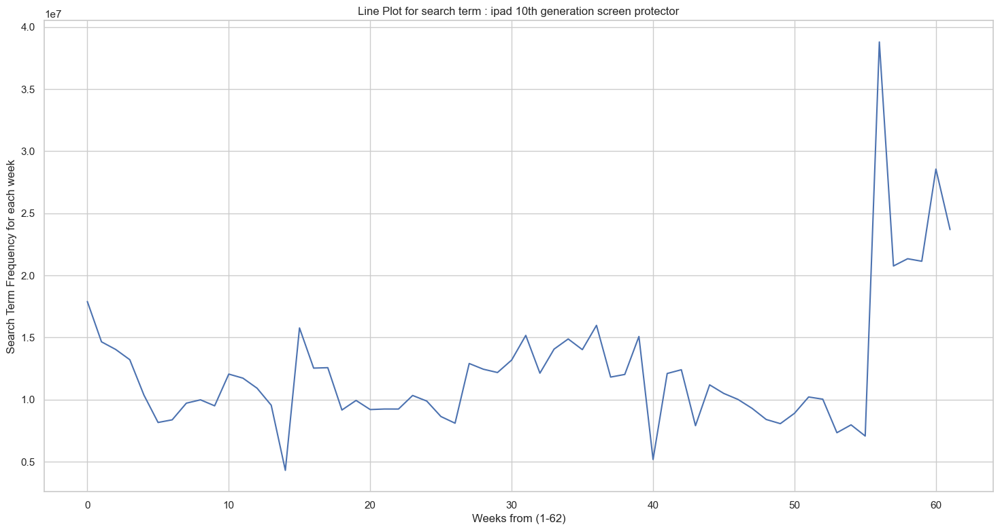

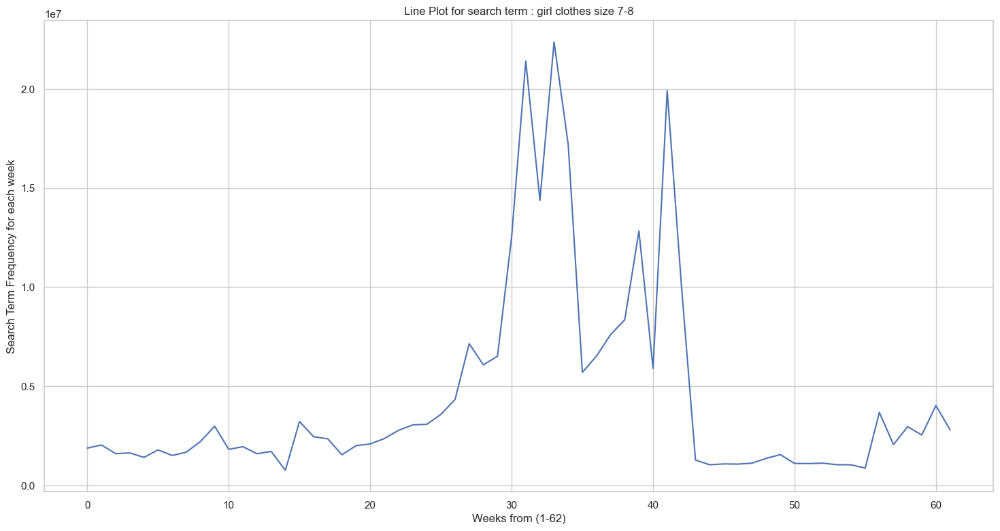

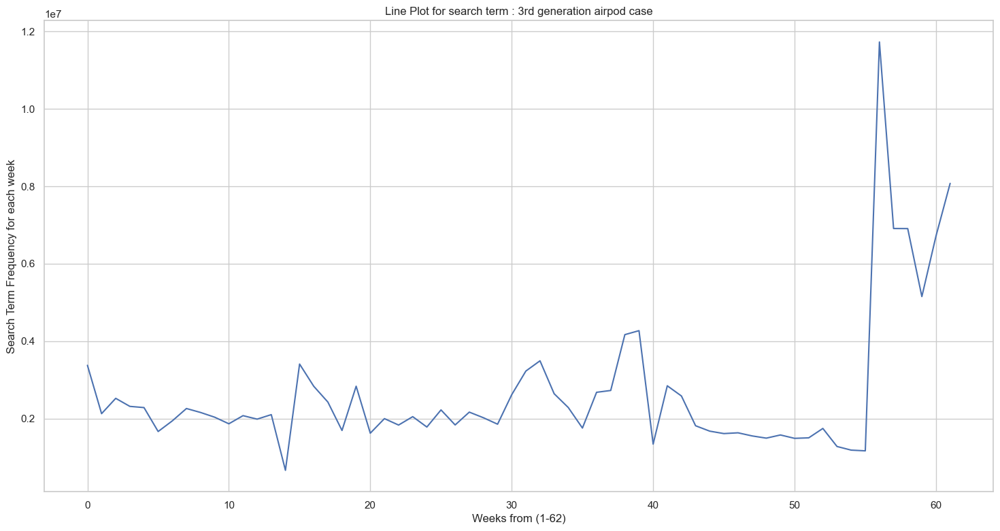

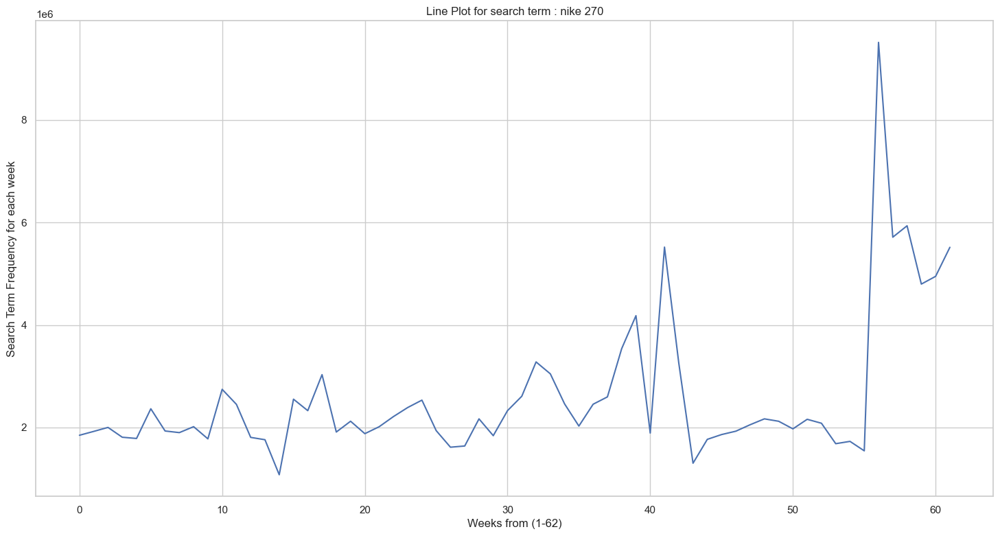

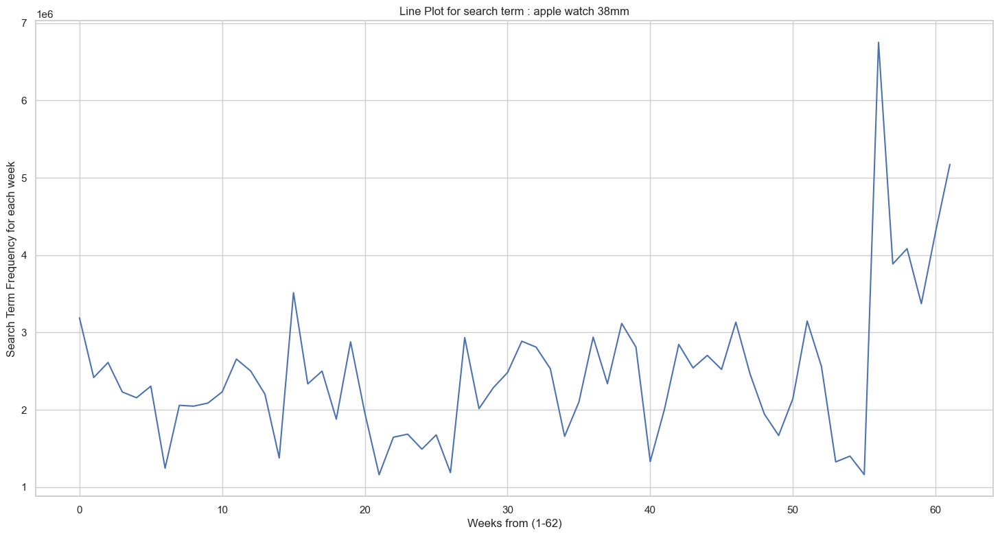

...

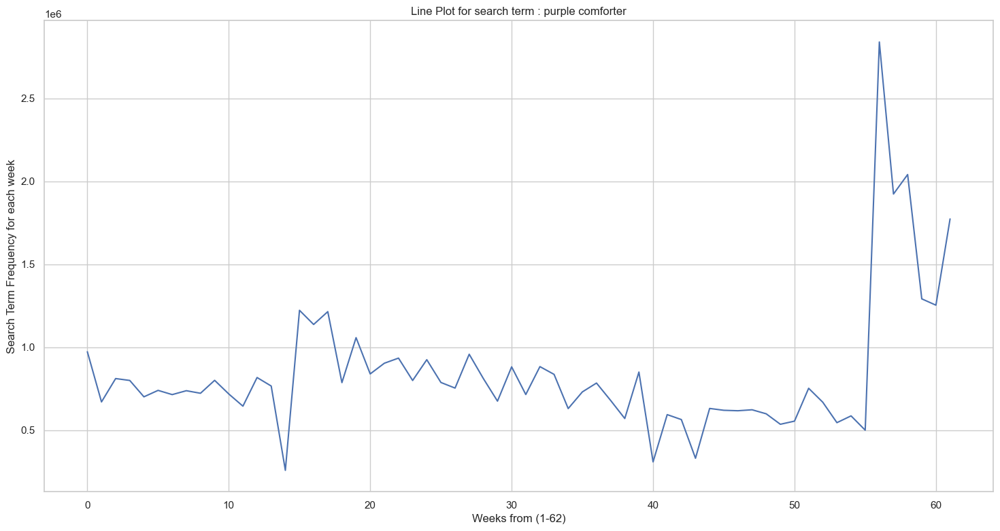

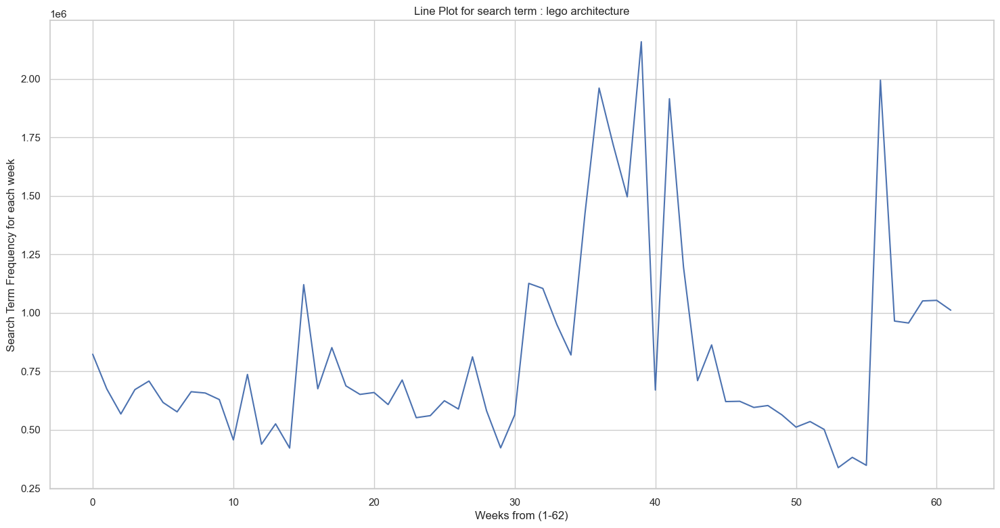

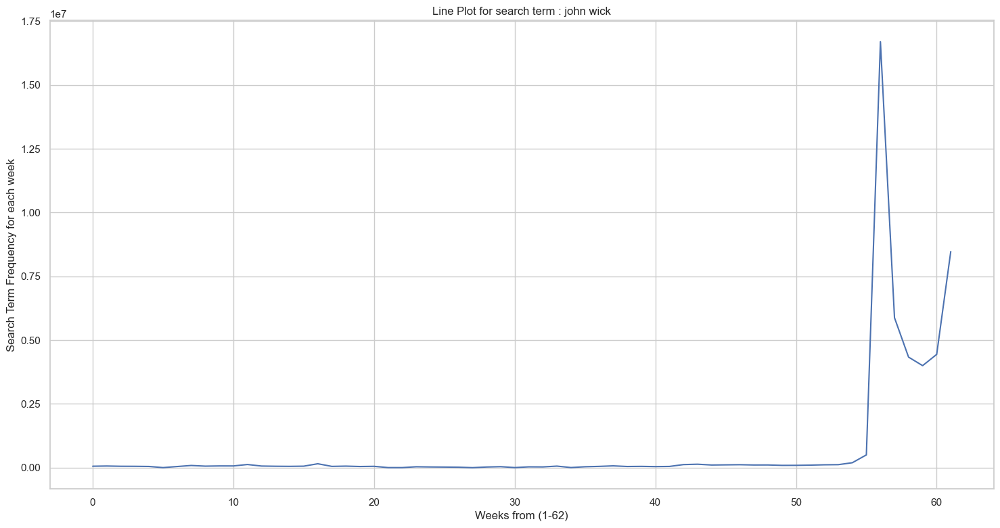

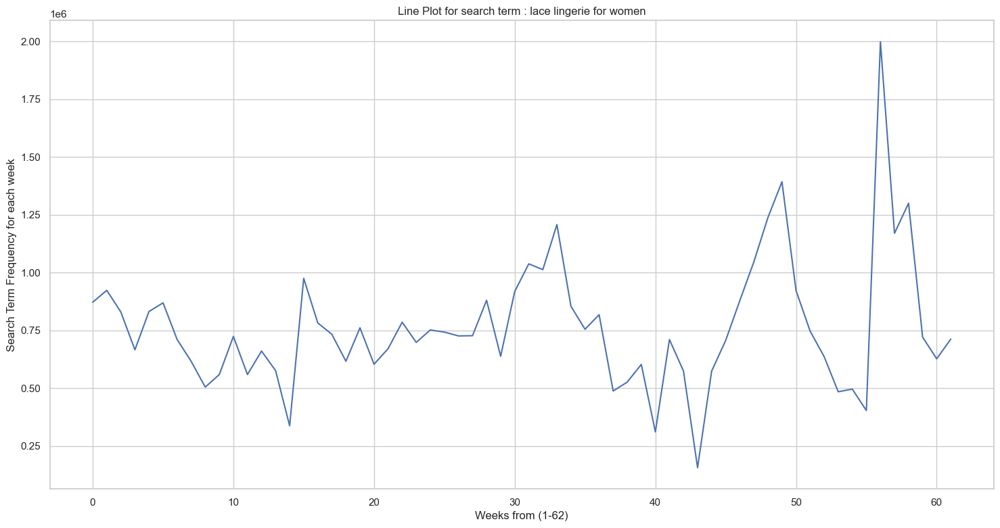

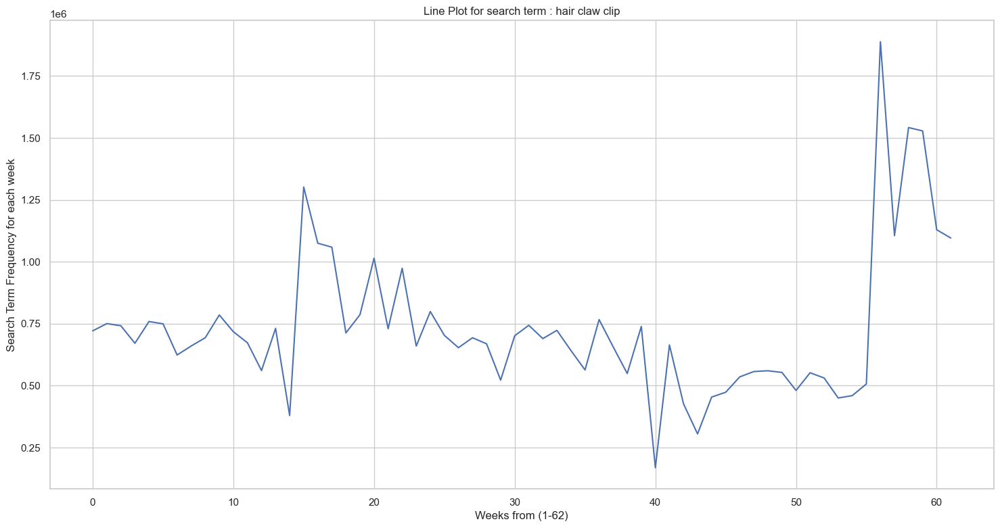

In [266]:
#plot n best frequency curves
data = Most_Frequently_used
for i in range(data.shape[0]):
    time_series_plot(i,data) 

In [159]:
#Select top 30 least search terms with higher frequency
n_least = 30
Least_Frequently_used = frequently_searched_vals(Frequency_values,n_least,"least")
print([Search_Terms[i] for i in Least_Frequently_used.index])
Least_Frequently_used['search_terms'] = Search_Terms[Least_Frequently_used.index]

['grandfather clock', 'frog stuffed animal', 'minecraft ps4', 'jumper cables heavy duty', 'collectibles', 'cheap tv', 'origins', 'coast flashlights', 'headphones gaming', 'mouse mat', 'pen for ipad', 'mac pro', 'lap table', 'night splint', 'ecosmart led light bulbs', 'mini gun', 'hand coffee grinder', 'cigar holder', 'cable protector', 'pokemon poster', 'my way giorgio armani', 'cast iron wok', 'headphones apple', 'malayalam', 'reflective dog collar', 'reed diffuser oil refill', 'dental', 'harrys', 'hair iron', 'massager handheld']


In [160]:
Least_Frequently_used

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,Mean_values,search_terms
7986,1632.5,3306.0,1545.0,1391.0,1417.0,1173.0,1265.0,2508.0,1408.0,1419.0,...,1323.0,1031.0,2953.0,3268.0,3450.0,3473.0,3121.0,2908.0,1714,grandfather clock
7238,2037.0,4266.0,2313.0,3166.0,2256.0,2148.0,2938.0,2246.0,3216.5,1973.0,...,1080.0,1016.0,2690.0,2057.0,2548.0,2579.0,2691.0,2069.0,1768,frog stuffed animal
12070,1228.0,2848.0,1364.0,1357.0,1223.0,1067.0,1186.0,2346.0,1170.0,1248.0,...,1520.0,1276.0,6698.0,3744.0,3956.0,3681.0,3319.0,3424.0,1818,minecraft ps4
9724,1303.0,2550.0,1178.0,2520.0,2107.0,1617.5,2200.0,1190.0,2524.0,2702.0,...,1028.0,1127.0,2095.0,2212.0,3034.0,1236.0,2151.0,1885.0,1881,jumper cables heavy duty
4166,1376.0,1493.0,1663.0,2922.0,2460.0,2271.0,1044.0,2692.0,1313.0,2712.0,...,1231.0,1014.0,1361.0,1246.0,1418.0,1138.0,1977.5,1579.0,1931,collectibles
3617,3384.0,1712.0,3074.0,1406.0,2716.0,2138.0,1323.0,1489.0,2926.0,2762.0,...,1110.0,1253.5,1379.0,1484.0,2667.0,1550.0,1680.0,2312.0,1964,cheap tv
13478,2756.0,2490.0,2386.0,2334.0,2000.0,2433.0,2472.0,2258.0,2568.0,3082.0,...,1094.0,1018.0,2095.0,2044.0,2171.0,1595.0,1780.0,1409.0,1986,origins
4023,2118.0,1133.0,2096.0,1138.0,1045.0,2156.0,2222.0,2376.0,2400.0,1266.0,...,1298.0,1158.0,3087.0,3014.0,3554.0,3366.0,3013.0,3016.0,1988,coast flashlights
8615,2162.0,2480.0,2322.0,2222.0,2132.0,2651.0,2977.0,1277.0,2344.0,2478.0,...,1266.0,1165.5,2054.0,2053.0,1704.0,1407.0,1149.0,1485.0,1997,headphones gaming
12450,2772.0,2792.0,1232.0,2316.0,1006.0,2230.0,2088.0,1087.0,2586.0,2448.0,...,1118.0,1009.0,2054.0,2457.0,2461.0,3148.0,2335.0,1888.0,1999,mouse mat


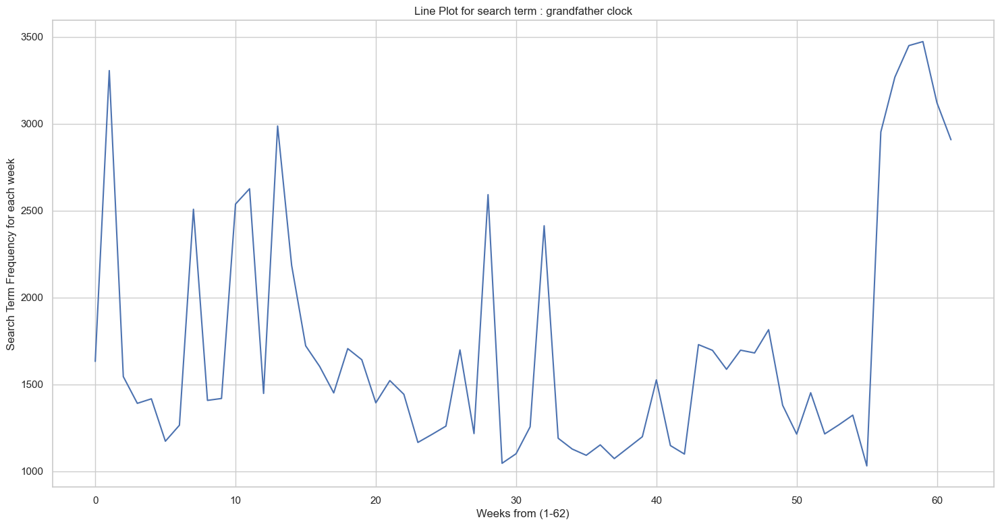

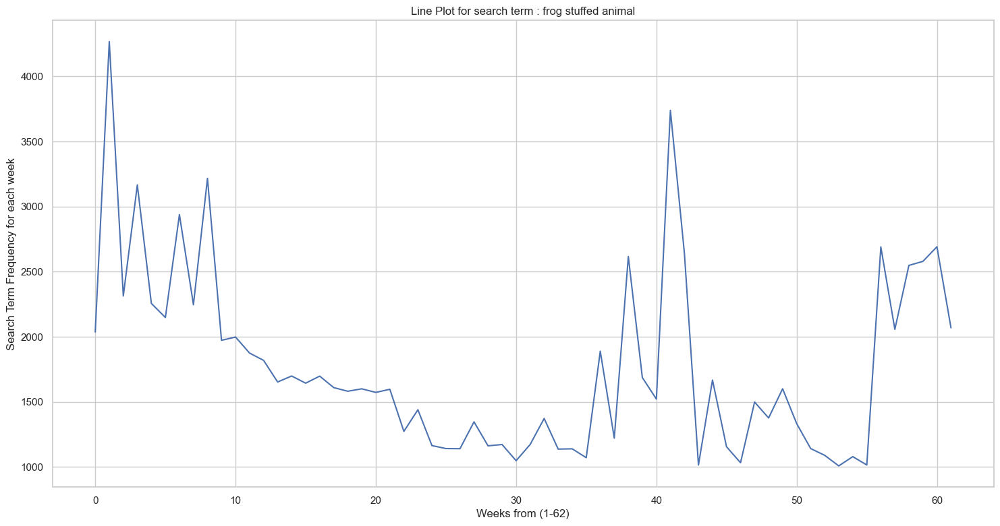

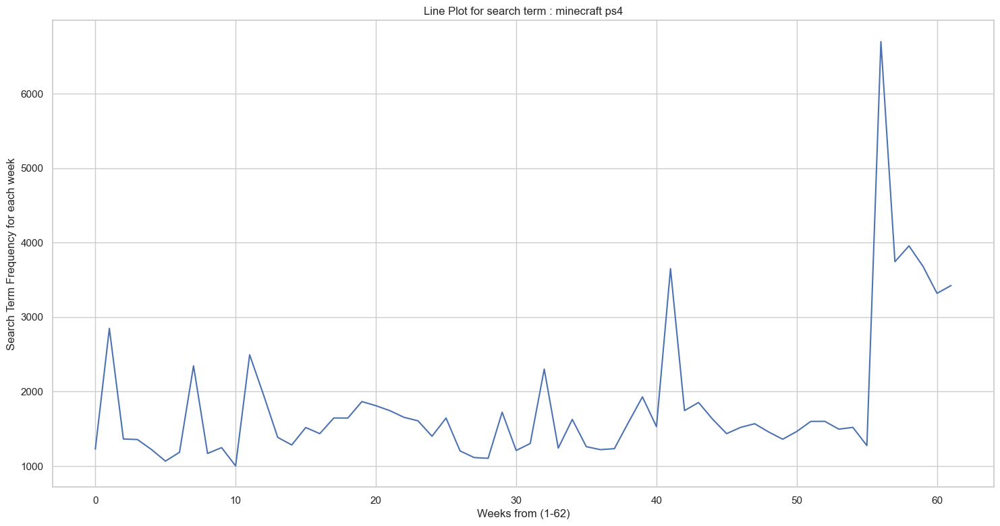

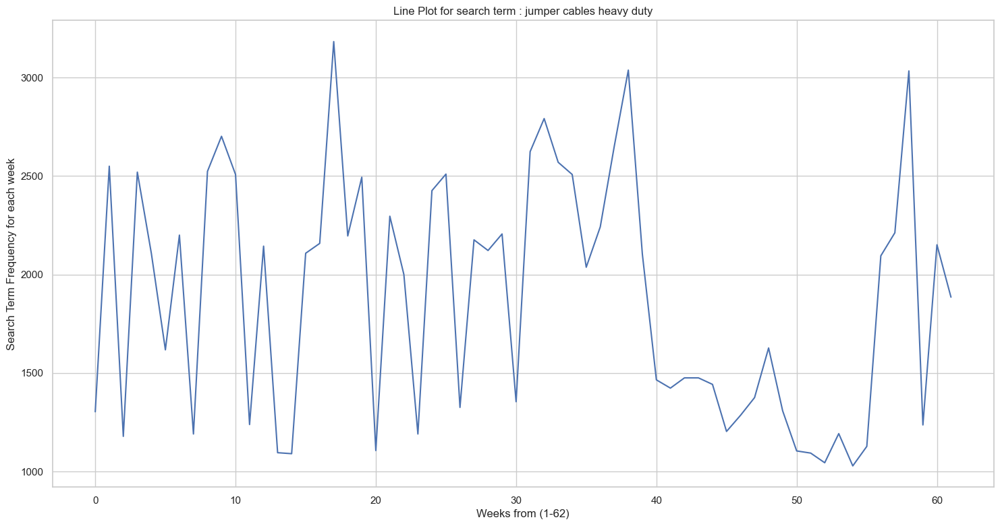

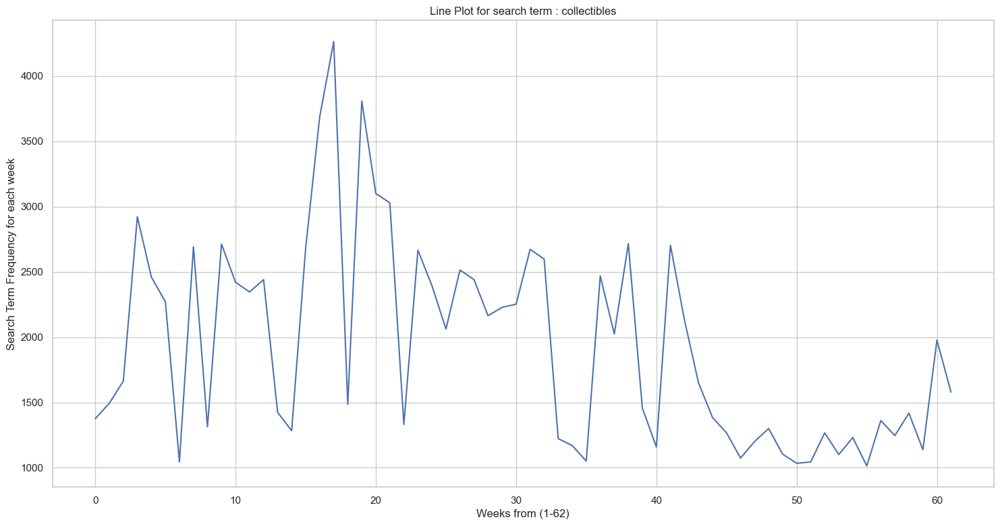

...

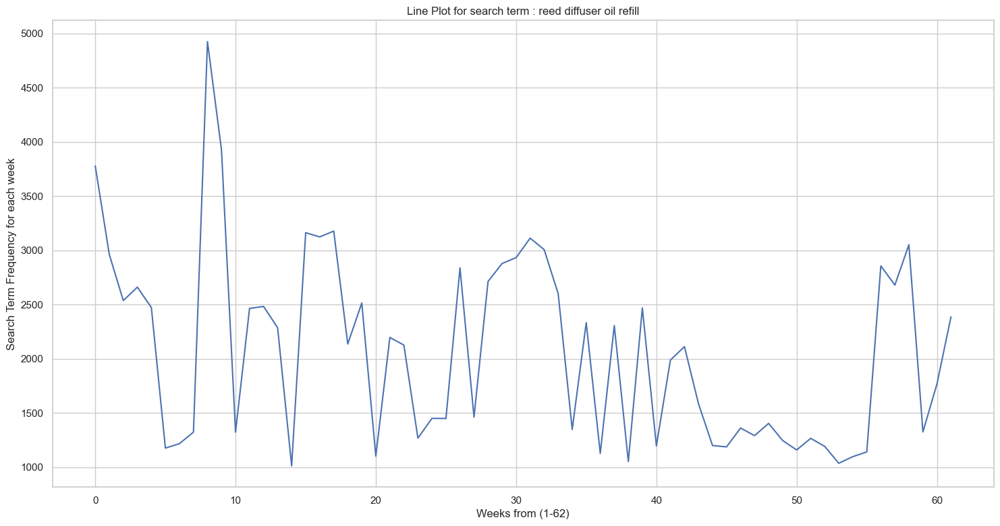

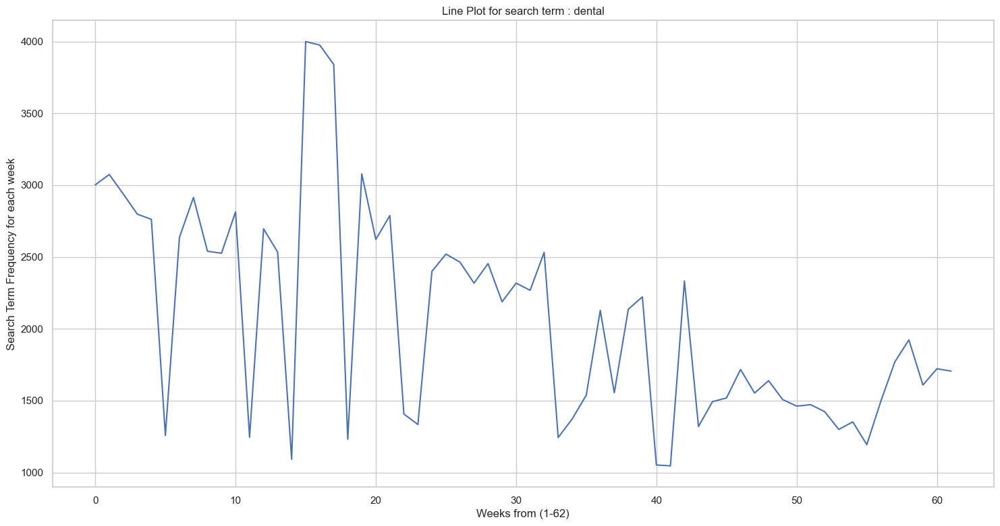

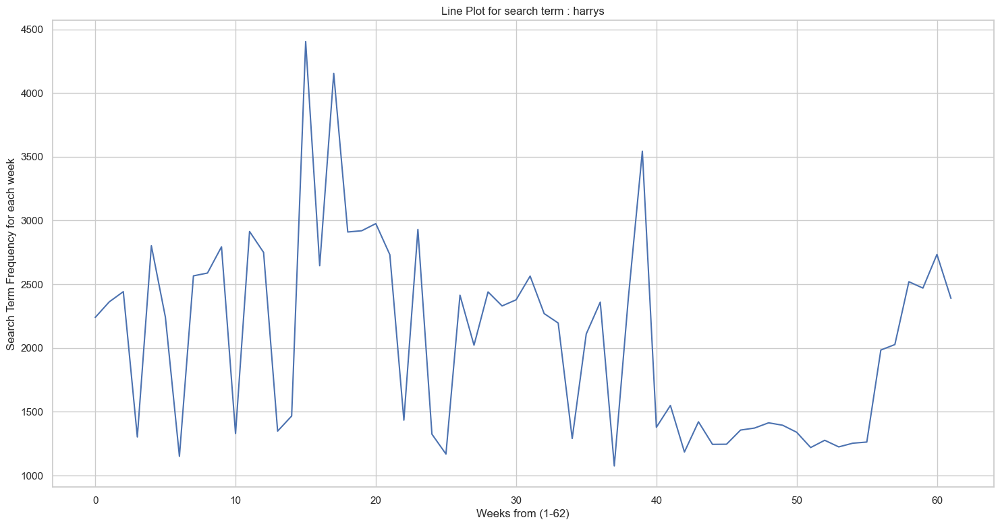

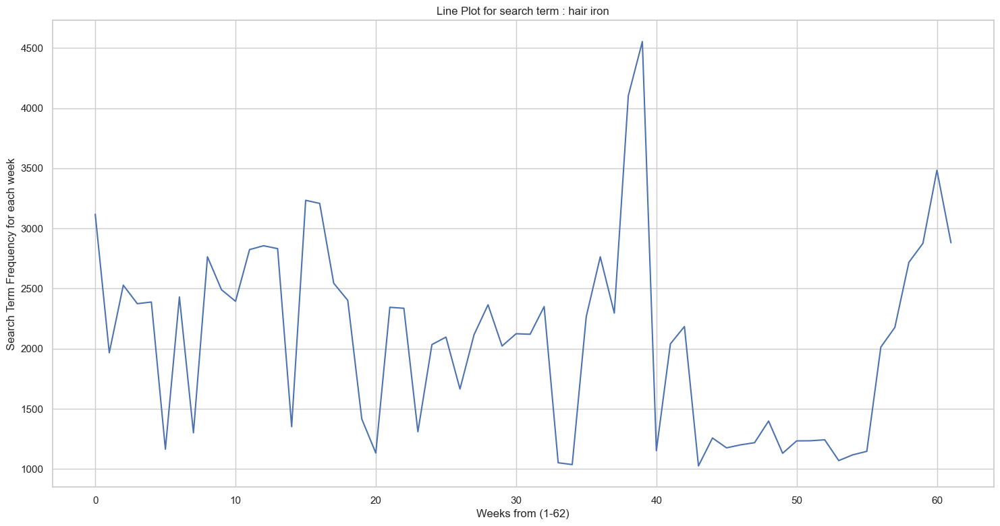

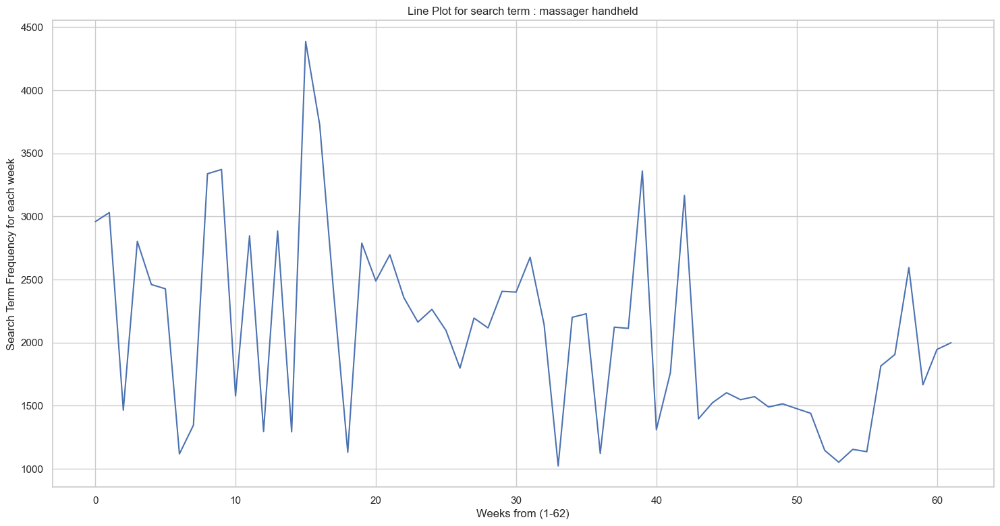

In [267]:
#plot n least frequency curves
data = Least_Frequently_used
for i in range(data.shape[0]):
    time_series_plot(i,data)